In [ ]:
from pathlib import Path
import sys

import geopandas as gpd
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
from neuralhydrology.datasetzoo import get_dataset
from neuralhydrology.datautils.utils import load_scaler
from neuralhydrology.modelzoo.cudalstm import CudaLSTM
from neuralhydrology.modelzoo.customlstm import CustomLSTM
from neuralhydrology.utils.config import Config
import numpy as np
import pandas as pd
import torch
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm

sys.path.append("../")
from visualizations.scripts.drawer import (
    create_nse_boxplots,
    russia_plots,
    russia_plots_n,
)

plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
# setting device on GPU if available, else CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
print()

# Additional Info when using cuda
if device.type == "cuda":
    print(torch.cuda.get_device_name(0))
    print("Memory Usage:")
    print("Allocated:", round(torch.cuda.memory_allocated(0) / 1024**3, 1), "GB")
    print("Cached:   ", round(torch.cuda.memory_reserved(0) / 1024**3, 1), "GB")


Using device: cuda

NVIDIA GeForce RTX 4080 SUPER
Memory Usage:
Allocated: 0.0 GB
Cached:    0.0 GB


In [38]:
def state_drawer():
    pass


def lstm_layer_correlation(
    state_dict: dict,
    date_range: np.ndarray,
    meteo_array: np.ndarray,
    data_name: str,
    interest_states: tuple = ("c_n", "h_n"),
    correlation_threshold: float = 0.7,
    draw_plot: bool = False,
):
    """Analyze correlation between LSTM hidden states and meteorological data.

    Args:
    ----
        state_dict (dict): Dictionary containing LSTM hidden states for different layers.
        date_range (np.ndarray): Array of dates corresponding to the time series data.
        meteo_array (np.ndarray): Array of meteorological values to correlate with hidden states.
        data_name (str): Name of the meteorological variable for plotting and identification.
        interest_states (tuple): Tuple of state layer names to analyze. Defaults to ("c_n", "h_n").
        correlation_threshold (float): Minimum correlation coefficient to consider significant. Defaults to 0.7.
        draw_plot (bool): Whether to generate visualization plots of correlations. Defaults to False.

    Returns:
    -------
        Tuple: A tuple containing:
            - best_correlation (dict): Dictionary with the best correlation values for each layer.
            - state_correlation (dict): Dictionary with detailed correlation values for each state in each layer.

    """
    if len(date_range) != len(meteo_array):
        date_range = date_range[: len(meteo_array)]
    best_correlation = {}
    state_correlation = {}

    for layer in interest_states:
        # Concatenate all batches into one tensor that contains the final time step of each sample.
        cell_states = torch.cat([state_dict[layer][:, -1, :]], dim=0)
        cell_states = cell_states.detach().numpy()

        # Load the forcings input for the corresponding date range
        corr_data = {}
        state_correlation[layer] = {}
        for i in range(cell_states[:, :].shape[1]):
            state_corr = cell_states[:, i]
            if len(state_corr) != len(meteo_array):
                state_corr = state_corr[: len(meteo_array)]
            corr_coef = np.corrcoef(state_corr, meteo_array)
            corr_coef = corr_coef[0, 1]
            state_correlation[layer][f"{i}"] = corr_coef
            if corr_coef > correlation_threshold:
                corr_data[f"{i}"] = corr_coef

        if len(corr_data) == 0:
            best_correlation[layer] = 0.01
        #     print(
        #         f"No states correlated with {data_name} for {layer} with threshold of {correlation_threshold}"
        #     )
        else:
            cell_value = int(max(corr_data, key=corr_data.get))
            best_correlation[layer] = corr_data[f"{cell_value}"]
            if draw_plot:
                _, (ax, ax2) = plt.subplots(2, 1, figsize=(15, 6), sharex=True)
                # ax.plot(date_range.to_numpy(), cell_states, c="C0", alpha=0.2)

                plot_cell = cell_states[:, cell_value]

                if len(plot_cell) != len(meteo_array):
                    plot_cell = plot_cell[: len(meteo_array)]

                ax.plot(date_range, plot_cell, c="red")
                ax.set_ylabel(f"{layer}")
                ax.set_title(
                    f" best cell state {cell_value} for {layer} layer, correlation={corr_data[f'{cell_value}']:.2f}",
                    fontsize=24,
                )
                ax2.set_ylabel(f"{data_name}")
                ax2.plot(date_range, meteo_array, c="blue")
                plt.tight_layout()

    for key, state_dict in state_correlation.items():
        state_correlation[key] = sorted(
            state_dict.items(), key=lambda item: item[1], reverse=True
        )  # [:10]
    return (best_correlation, state_correlation, corr_data)


## 256 hidden size

### Prepare model

In [ ]:
config_file = Path(
    "../data/lstm_configs/model_runs/cudalstm_q_mm_day_mswep_no_autocorr_static_1103_191754/config.yml"
)

cudalstm_config = Config(config_file)

# create a new model instance with random weights
cuda_lstm = CudaLSTM(cfg=cudalstm_config)

# load the trained weights into the new model.
model_path = cudalstm_config.run_dir / "model_epoch024.pt"
model_weights = torch.load(
    str(model_path), map_location="cpu"
)  # load the weights from the file, creating the weight tensors on CPU
cuda_lstm.load_state_dict(
    model_weights
)  # set the new model's weights to the values loaded from file
custom_lstm = CustomLSTM(
    cfg=cudalstm_config
)  # create a new CustomLSTM (with random weights)
custom_lstm.copy_weights(cuda_lstm)  # copy the CudaLSTM weights into the CustomLSTM
# make sure we're in eval mode where dropout is deactivated
custom_lstm.eval()

# load the dataset
scaler = load_scaler(cudalstm_config.run_dir)
dataset = get_dataset(cudalstm_config, is_train=False, period="test", scaler=scaler)
dataloader = DataLoader(
    dataset, batch_size=731, shuffle=False, collate_fn=dataset.collate_fn
)

example_states = custom_lstm(next(iter(dataloader)))
example_states.keys()


dict_keys(['h_n', 'c_n', 'i', 'f', 'g', 'o', 'y_hat'])

### Read geometry and model data results

In [5]:
gauges_file = gpd.read_file("../data/geometry/russia_gauges.gpkg")
gauges_file["gauge_id"] = gauges_file["gauge_id"].astype(str)
gauges_file = gauges_file.set_index("gauge_id")
ws_file = gpd.read_file("../data/geometry/russia_ws.gpkg")
ws_file = ws_file.set_index("gauge_id")
ws_file = ws_file[ws_file["new_area"] <= 50000]


def lim_definer(area: float):
    lim_1, lim_2, lim_3, lim_4 = 100, 2000, 10000, 50000

    if area < lim_1:
        return "а) < 100 $км^2$"
    elif (area >= lim_1) & (area <= lim_2):
        return "б) 100 $км^2$ - 2 000 $км^2$"
    elif (area > lim_2) & (area <= lim_3):
        return "в) 2 000 $км^2$ - 10 000 $км^2$"
    elif (area > lim_3) & (area <= lim_4):
        return "г) 10 000 $км^2$ - 50 000 $км^2$"
    else:
        return "> 50 000 $км^2$"


ws_file["size"] = ws_file.loc[:, "new_area"].apply(lambda x: lim_definer(x))
ws_file["size"] = pd.Categorical(
    ws_file["size"],
    [
        "а) < 100 $км^2$",
        "б) 100 $км^2$ - 2 000 $км^2$",
        "в) 2 000 $км^2$ - 10 000 $км^2$",
        "г) 10 000 $км^2$ - 50 000 $км^2$",
    ],
)

basemap_data = gpd.read_file("../data/geometry/basemap_2023.gpkg")

basin_districts = gpd.read_file("../data/geometry/basin_districts_2024.gpkg")
basin_districts = basin_districts.reset_index(drop=True)
# basin_districts = basin_districts.drop([26, 27])
# fixed umgs shapes
basin_districts = basin_districts.reindex(
    [
        0,
        1,
        2,
        3,
        4,
        5,
        6,
        7,
        8,
        26,
        10,
        11,
        12,
        27,
        14,
        15,
        16,
        17,
        18,
        19,
        20,
        21,
        22,
        23,
        24,
        25,
        9,
        13,
    ]
)
basin_districts = basin_districts.reset_index(drop=True)
basin_districts = basin_districts.rename(columns={"BAS_OKRUG": "name1"})

hbv_table = pd.read_csv(
    "../conclusions/tables/HBV_res_mle_NSE.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)

gr4j_table = pd.read_csv(
    "../conclusions/tables/GR4J_res_mle_NSE.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)
rfr_table = pd.read_csv(
    "../conclusions/tables/res_rfr_cv.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)
lstm_regional = pd.read_csv(
    "../conclusions/tables/cudalstm_q_mm_day_mswep_res.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)
lstm_single = pd.read_csv(
    "../conclusions/tables/Single_LSTM_table.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)
lstm_no_static = pd.read_csv(
    "../conclusions/tables/LSTM_no_static_res.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)

common_index = (
    hbv_table.index.intersection(gr4j_table.index)
    .intersection(rfr_table.index)
    .intersection(lstm_regional.index)
    .intersection(ws_file.index)
    .intersection(lstm_single.index)
    .intersection(lstm_no_static.index)
)


ws_file = ws_file.loc[common_index, :]
gauges_file = gauges_file.loc[common_index, :]
gauges_file["size"] = np.nan
gauges_file = gauges_file.combine_first(ws_file)
gauges_file = gauges_file.set_crs(epsg=4326)


In [6]:
lstm_no_static = pd.read_csv(
    "../conclusions/tables/LSTM_no_static_res.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)

common_index = (
    hbv_table.index.intersection(gr4j_table.index)
    .intersection(rfr_table.index)
    .intersection(lstm_regional.index)
    .intersection(ws_file.index)
    .intersection(lstm_single.index)
    .intersection(lstm_no_static.index)
)


ws_file = ws_file.loc[common_index, :]
gauges_file = gauges_file.loc[common_index, :]
gauges_file["size"] = np.nan
gauges_file = gauges_file.combine_first(ws_file)
gauges_file = gauges_file.set_crs(epsg=4326)


In [7]:
test_date_range = pd.date_range(
    cudalstm_config.test_start_date,
    cudalstm_config.test_end_date - pd.Timedelta("1D"),
    freq="1D",
)


NameError: name 'cudalstm_config' is not defined

### Metrics file

In [8]:
def read_table_gauge_str(
    table_path: str, index_filter: pd.Index = pd.Index([])
) -> tuple[pd.DataFrame, float]:
    table = pd.read_csv(table_path)
    if "Unnamed: 0" in table.columns:
        table = table.rename(columns={"Unnamed: 0": "gauge_id"})
    table["gauge_id"] = table["gauge_id"].astype(str)
    table = table.set_index("gauge_id")

    if index_filter.empty:
        pass
    else:
        table = table.loc[table.index.isin(index_filter)]
    median_nse = table["NSE"].median()
    return table, median_nse


In [ ]:
lstm_mswep_table, lstm_mswep_nse = read_table_gauge_str(
    table_path="../conclusions/tables/cudalstm_q_mm_day_mswep_res.csv",
    index_filter=common_index,
)
lstm_era5_table, lstm_era5_nse = read_table_gauge_str(
    table_path="../conclusions/tables/cudalstm_q_mm_day_era5_res.csv",
    index_filter=common_index,
)
lstm_era5_land_table, lstm_era5_land_nse = read_table_gauge_str(
    table_path="../conclusions/tables/cudalstm_q_mm_day_era5l_res.csv",
    index_filter=common_index,
)
lstm_gpcp_table, lstm_gpcp_nse = read_table_gauge_str(
    table_path="../conclusions/tables/cudalstm_q_mm_day_gpcp_res.csv",
    index_filter=common_index,
)

lstm_geom_nse = gauges_file.loc[:, ["geometry"]]

lstm_geom_nse.loc[
    :, ["NSE LSTM MSWEP", "NSE LSTM ERA5", "NSE LSTM ERA5-Land", "NSE LSTM GPCP"]
] = pd.concat(
    [
        lstm_mswep_table.loc[common_index, "NSE"],
        lstm_era5_table.loc[common_index, "NSE"],
        lstm_era5_land_table.loc[common_index, "NSE"],
        lstm_gpcp_table.loc[common_index, "NSE"],
    ],
    axis=1,
).values
lstm_geom_nse = lstm_geom_nse.dropna()

lstm_geom_nse["best NSE"] = lstm_geom_nse[
    ["NSE LSTM MSWEP", "NSE LSTM ERA5", "NSE LSTM ERA5-Land", "NSE LSTM GPCP"]
].max(axis=1)
mswep_index = lstm_geom_nse[
    lstm_geom_nse["best NSE"].isin(lstm_geom_nse["NSE LSTM MSWEP"])
].index
era5_index = lstm_geom_nse[
    lstm_geom_nse["best NSE"].isin(lstm_geom_nse["NSE LSTM ERA5"])
].index
era5_land_index = lstm_geom_nse[
    lstm_geom_nse["best NSE"].isin(lstm_geom_nse["NSE LSTM ERA5-Land"])
].index
gpcp_index = lstm_geom_nse[
    lstm_geom_nse["best NSE"].isin(lstm_geom_nse["NSE LSTM GPCP"])
].index

for name, index in {
    "MSWEP": mswep_index,
    "ERA5": era5_index,
    "ERA5-Land": era5_land_index,
    "GPCP": gpcp_index,
}.items():
    lstm_geom_nse.loc[index, "Лучшая модель"] = name


In [12]:
ugms_dict = dict()

for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = lstm_geom_nse.loc[
        [geom.intersects(gage_point) for gage_point in lstm_geom_nse["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]
    ugms_dict[ugms_name] = ugms_part
    basin_districts.loc[i, ["best NSE"]] = ugms_part[["best NSE"]].median()

basin_districts.loc[[26, 27], ["best NSE"]] = np.nan


### Metrics by Geo Cluster

In [ ]:
geo_cluster = gpd.read_file("../conclusions/tables/HydroATLAS_clustering.gpkg")
geo_cluster = geo_cluster.set_index("gauge_id")
geo_cluster.index = geo_cluster.index.astype(str)
geo_cluster = geo_cluster.loc[common_index, :]


In [18]:
cluster_table = pd.DataFrame()

for cluster_name, group_id in geo_cluster.groupby(by="Кластер").groups.items():
    cluster_table.loc[cluster_name, "Постов в кластере"] = (
        f"{lstm_geom_nse.loc[group_id, 'best NSE'].__len__():.0f}"
    )
    cluster_table.loc[cluster_name, "NSE медиана"] = (
        f"{(lstm_geom_nse.loc[group_id, 'best NSE'].median()):.2f}"
    )
    cluster_table.loc[cluster_name, "NSE < 0.5"] = (
        f"{(lstm_geom_nse.loc[group_id, 'best NSE'] < 0.5).sum():.0f}"
    )
    cluster_table.loc[cluster_name, "NSE < 0"] = (
        f"{(lstm_geom_nse.loc[group_id, 'best NSE'] < 0).sum():.0f}"
    )
    cluster_table.loc[cluster_name, "NSE > 0.5"] = (
        f"{((lstm_geom_nse.loc[group_id, 'best NSE'] > 0.5).sum()):.0f}"
    )
    cluster_table.loc[cluster_name, "NSE удовл., %"] = (
        f"{((lstm_geom_nse.loc[group_id, 'best NSE'] > 0.5).sum() / lstm_geom_nse.loc[group_id, 'best NSE'].__len__()):.1%}"
    )


In [ ]:
cluster_table.to_excel("../conclusions/tables/nse_cluster_table.xlsx")

cluster_table


,Постов в кластере,NSE медиана,NSE < 0.5,NSE < 0,NSE > 0.5,"NSE удовл., %"
Кластер 1,213,0.72,44,6,169,79.3%
Кластер 2,145,0.82,6,0,139,95.9%
Кластер 3,34,0.68,10,3,24,70.6%
Кластер 4,66,0.67,15,1,51,77.3%
Кластер 5,215,0.78,27,5,188,87.4%
Кластер 6,34,-0.05,28,17,6,17.6%
Кластер 7,174,0.43,102,41,72,41.4%
Кластер 8,52,0.71,7,1,45,86.5%
Кластер 9,63,0.84,2,0,61,96.8%


### Metrics by Hydro Cluster

In [16]:
hydro_cluster = gpd.read_file("../conclusions/tables/Q_clustering.gpkg")
hydro_cluster = hydro_cluster.set_index("gauge_id")
hydro_cluster.index = hydro_cluster.index.astype(str)
hydro_cluster = hydro_cluster.loc[common_index, :]

In [17]:
hydro_cluster_table = pd.DataFrame()

for cluster_name, group_id in hydro_cluster.groupby(by="Кластер").groups.items():
    hydro_cluster_table.loc[cluster_name, "Постов в кластере"] = (
        f"{lstm_geom_nse.loc[group_id, 'best NSE'].__len__():.0f}"
    )
    hydro_cluster_table.loc[cluster_name, "NSE медиана"] = (
        f"{(lstm_geom_nse.loc[group_id, 'best NSE'].median()):.2f}"
    )
    hydro_cluster_table.loc[cluster_name, "NSE < 0.5"] = (
        f"{(lstm_geom_nse.loc[group_id, 'best NSE'] < 0.5).sum():.0f}"
    )
    hydro_cluster_table.loc[cluster_name, "NSE < 0"] = (
        f"{(lstm_geom_nse.loc[group_id, 'best NSE'] < 0).sum():.0f}"
    )
    hydro_cluster_table.loc[cluster_name, "NSE > 0.5"] = (
        f"{((lstm_geom_nse.loc[group_id, 'best NSE'] > 0.5).sum()):.0f}"
    )
    hydro_cluster_table.loc[cluster_name, "NSE удовл., %"] = (
        f"{((lstm_geom_nse.loc[group_id, 'best NSE'] > 0.5).sum() / lstm_geom_nse.loc[group_id, 'best NSE'].__len__()):.1%}"
    )


In [20]:
hydro_cluster_table.to_excel("../conclusions/tables/nse_hydro_cluster_table.xlsx")

hydro_cluster_table


,Постов в кластере,NSE медиана,NSE < 0.5,NSE < 0,NSE > 0.5,"NSE удовл., %"
Кластер 1,171,0.76,40,19,131,76.6%
Кластер 2,113,0.69,21,3,92,81.4%
Кластер 3,139,0.83,11,2,128,92.1%
Кластер 4,156,0.71,32,6,124,79.5%
Кластер 5,26,0.76,2,0,24,92.3%
Кластер 6,60,0.81,8,1,52,86.7%
Кластер 7,102,0.78,14,1,88,86.3%
Кластер 8,107,0.41,62,25,45,42.1%
Кластер 9,122,0.60,51,17,71,58.2%


### Metrics by area

In [23]:
area_size_table = pd.DataFrame()

for cluster_name, group_id in ws_file.groupby(by="size").groups.items():
    area_size_table.loc[f"{cluster_name}", "Постов в кластере"] = (
        f"{lstm_geom_nse.loc[group_id, 'best NSE'].__len__():.0f}"
    )
    area_size_table.loc[f"{cluster_name}", "NSE медиана"] = (
        f"{(lstm_geom_nse.loc[group_id, 'best NSE'].median()):.2f}"
    )
    area_size_table.loc[f"{cluster_name}", "NSE < 0.5"] = (
        f"{(lstm_geom_nse.loc[group_id, 'best NSE'] < 0.5).sum():.0f}"
    )
    area_size_table.loc[f"{cluster_name}", "NSE < 0"] = (
        f"{(lstm_geom_nse.loc[group_id, 'best NSE'] < 0).sum():.0f}"
    )
    area_size_table.loc[f"{cluster_name}", "NSE > 0.5"] = (
        f"{((lstm_geom_nse.loc[group_id, 'best NSE'] > 0.5).sum()):.0f}"
    )
    area_size_table.loc[f"{cluster_name}", "NSE удовл., %"] = (
        f"{((lstm_geom_nse.loc[group_id, 'best NSE'] > 0.5).sum() / lstm_geom_nse.loc[group_id, 'best NSE'].__len__()):.1%}"
    )


/tmp/ipykernel_65106/2929387200.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for cluster_name, group_id in ws_file.groupby(by="size").groups.items():


In [ ]:
area_size_table.to_excel("../conclusions/tables/nse_size_table.xlsx")

area_size_table


,Постов в кластере,NSE медиана,NSE < 0.5,NSE < 0,NSE > 0.5,"NSE удовл., %"
а) < 100 $км^2$,22,0.60,8,1,14,63.6%
б) 100 $км^2$ - 2 000 $км^2$,488,0.67,136,32,352,72.1%
в) 2 000 $км^2$ - 10 000 $км^2$,307,0.75,73,28,234,76.2%
г) 10 000 $км^2$ - 50 000 $км^2$,179,0.82,24,13,155,86.6%


### Cell states vs Evaporation

In [ ]:
evaporation_state = pd.DataFrame()
evaporation_depth = dict()

for gauge_id in tqdm(gauges_file.index):
    try:
        gauge_cor, gauge_state_cor, corr_data = lstm_layer_correlation(
            state_dict=example_states,
            date_range=test_date_range.to_numpy(),
            meteo_array=pd.read_csv(
                f"../data/meteo_grids_2024/gleam/E/{gauge_id}.csv",
                index_col="date",
                parse_dates=["date"],
            )
            .loc[test_date_range]
            .to_numpy()
            .ravel(),
            correlation_threshold=0.7,
            data_name="Испарение",
            draw_plot=False,
            # interest_states=("c_n"),
        )
        evaporation_state.loc[gauge_id, "r скрытый фильтр"] = gauge_cor["h_n"]
        evaporation_state.loc[gauge_id, "r фильтр состояния"] = gauge_cor["c_n"]
        evaporation_state.loc[gauge_id, "geometry"] = gauges_file.loc[
            gauge_id, "geometry"
        ]
        gauge_state_cor = {
            cell: [int(i[0]) for i in vals] for cell, vals in gauge_state_cor.items()
        }
        evaporation_depth[gauge_id] = gauge_state_cor
    except FileNotFoundError:
        evaporation_state.loc[gauge_id, "r скрытый фильтр"] = 0.01
        evaporation_state.loc[gauge_id, "r фильтр состояния"] = 0.01
        evaporation_state.loc[gauge_id, "geometry"] = gauges_file.loc[
            gauge_id, "geometry"
        ]
    # evaporation_state.loc[gauge_id, "r "] = gauge_cor["h_n"]
evaporation_state = gpd.GeoDataFrame(
    evaporation_state, geometry="geometry", crs="epsg:4326"
)


  0%|          | 0/996 [00:00<?, ?it/s]

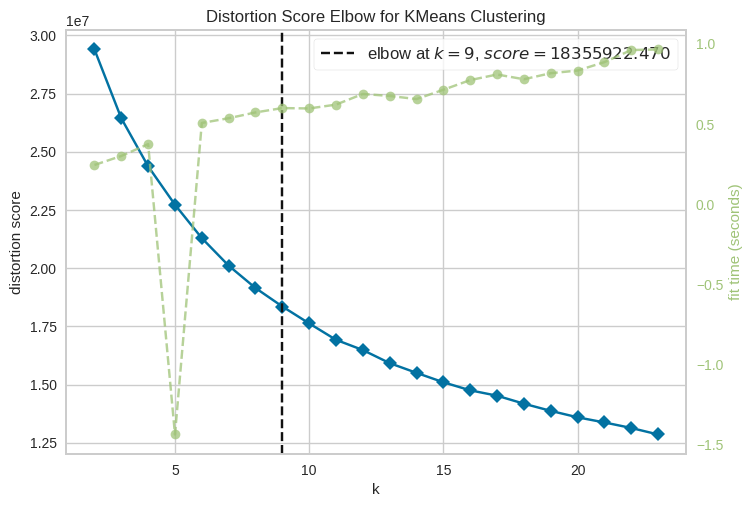

In [ ]:
# Import ElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

evaporation_depth_c_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["c_n"] for gauge_id, cell_dict in evaporation_depth.items()}
    )
    .T
)
evaporation_depth_h_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["h_n"] for gauge_id, cell_dict in evaporation_depth.items()}
    )
    .T
)

raw_features = evaporation_depth_c_n.values

model = KMeans(random_state=42, init="k-means++", n_init=420)
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2, 24), timings=True)
visualizer.fit(raw_features)  # Fit data to visualizer
visualizer.show();


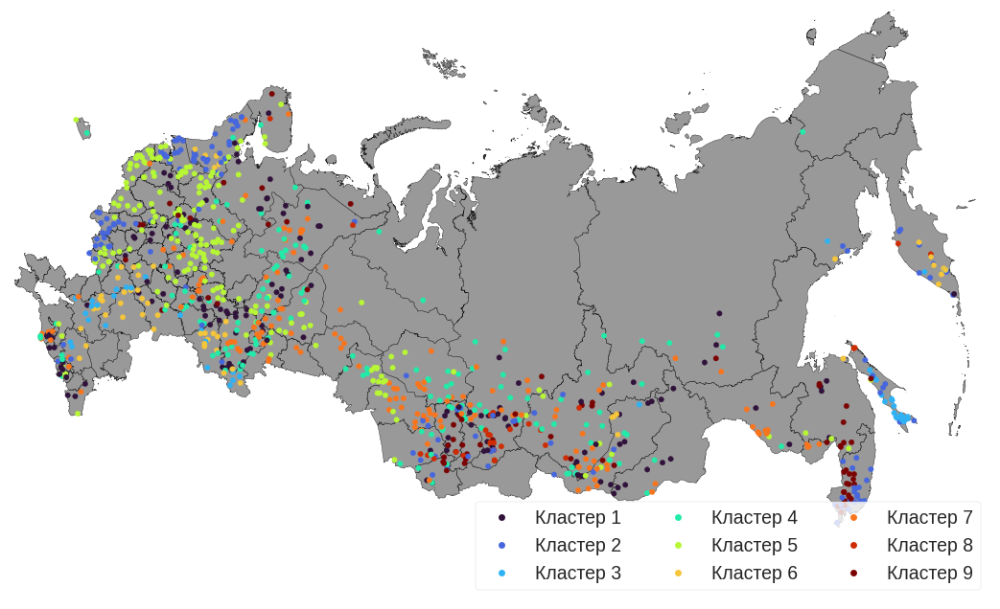

In [ ]:
number_of_clusters = 9
raw_features = evaporation_depth_h_n.values
cluster_alg = KMeans(
    n_clusters=number_of_clusters, random_state=42, init="k-means++", n_init=420
)

yhat_AC = cluster_alg.fit_predict(raw_features)
evaporation_depth_h_n["ResClust"] = [i + 1 for i in yhat_AC]

gauges_file["ResClust"] = np.nan

gauges_file = gauges_file.combine_first(evaporation_depth_h_n).dropna()
gauges_file["Кластер"] = [f"Кластер {int(i)}" for i in gauges_file["ResClust"]]

gauges_fig = russia_plots(
    gdf_to_plot=gauges_file,
    basemap_data=basemap_data,
    distinction_col="Кластер",
    cmap_name="turbo",
    #   metric_col='Кластер',
    # list_of_limits=list(range(1, 5)),
    figsize=(15, 8),
    just_points=True,
)


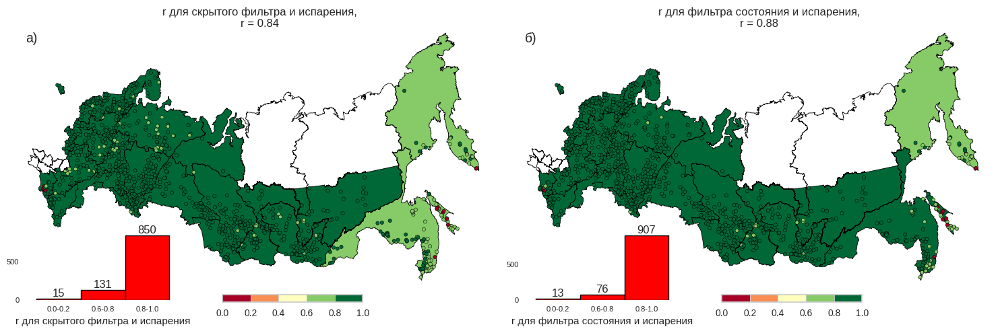

In [ ]:
evaporation_h_n_r = evaporation_state["r скрытый фильтр"].median()
evaporation_c_n_r = evaporation_state["r фильтр состояния"].median()

for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = evaporation_state.loc[
        [geom.intersects(gage_point) for gage_point in evaporation_state["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["r скрытый фильтр", "r фильтр состояния"]] = ugms_part[
        ["r скрытый фильтр", "r фильтр состояния"]
    ].median()

basin_districts.loc[[26, 27], ["r скрытый фильтр", "r фильтр состояния"]] = np.nan

meteo_nse = russia_plots_n(
    gdf_to_plot=evaporation_state,
    basemap_data=basemap_data,
    figsize=(15, 6),
    nrows=1,
    ncols=2,
    label_list=["а)", "б)"],
    list_of_limits=[0.0, 0.2, 0.4, 0.6, 0.8, 1.0],
    columns_from_gdf=["r скрытый фильтр", "r фильтр состояния"],
    hist_name=[
        "r для скрытого фильтра и испарения",
        "r для фильтра состояния и испарения",
    ],
    with_histogram=True,
    title_text=[
        f"r для скрытого фильтра и испарения,\nr = {evaporation_h_n_r:.2f}",
        f"r для фильтра состояния и испарения,\nr = {evaporation_c_n_r:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)


In [35]:
def ax_plot(
    gauge_id,
    cell_ax,
    meteo_ax,
    cell_data,
    meteo_data,
    data_range,
    cell_ax_title: str,
    cell_ax_ylabel: str,
    meteo_ax_title: str,
    meteo_ax_ylabel: str,
):
    cell_ax.plot(data_range, cell_data, c="red")
    cell_ax.set_ylabel(cell_ax_ylabel)
    cell_ax.set_title(
        cell_ax_title,
        fontsize=14,
    )
    cell_ax.set_xlim([pd.to_datetime("01/01/2019"), pd.to_datetime("01/01/2021")])
    cell_ax.grid(False)

    meteo_ax.plot(data_range, meteo_data, c="blue")
    meteo_ax.set_ylabel(meteo_ax_ylabel)
    meteo_ax.set_title(
        meteo_ax_title,
        fontsize=14,
    )
    meteo_ax.set_xlim([pd.to_datetime("01/01/2019"), pd.to_datetime("01/01/2021")])
    meteo_ax.grid(False)

    return None


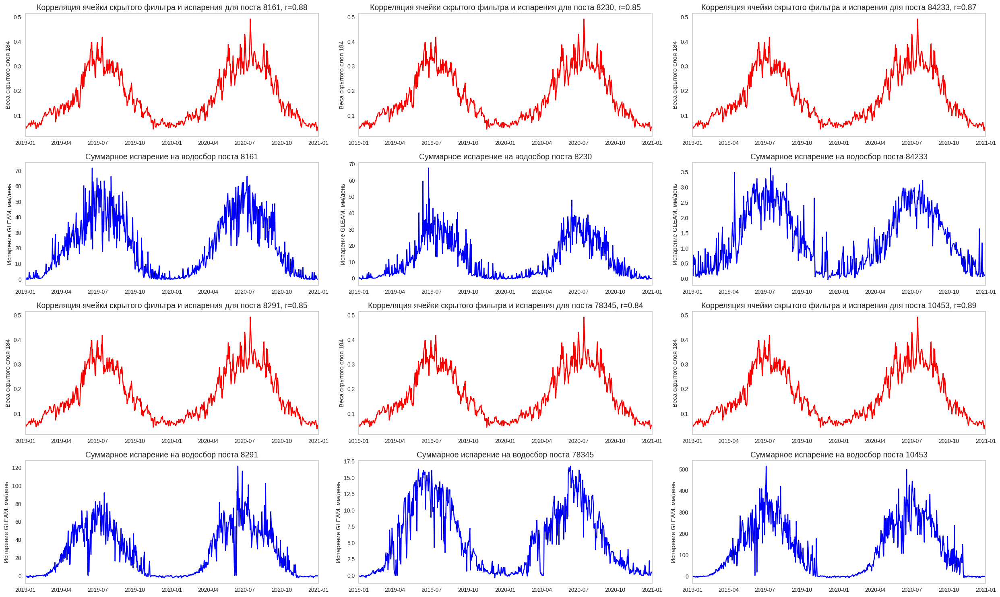

In [ ]:
sample_evap = (
    evaporation_state.sort_values(by="r скрытый фильтр", ascending=False)
    .head(420)
    .sample(n=6, random_state=42)
)


# Create a figure
fig = plt.figure(figsize=(25, 15))

# Define the GridSpec
gs = gridspec.GridSpec(4, 3)
cell_axs = [0, 1, 2, 6, 7, 8]
meteo_axs = [3, 4, 5, 9, 10, 11]
# Add subplots
axs = [fig.add_subplot(gs[i, j]) for i in range(4) for j in range(3)]

for gauge_id, cell_i, meteo_j in zip(
    sample_evap.index, cell_axs, meteo_axs, strict=False
):
    plot_cell = torch.cat(
        [example_states["h_n"][:-1, -1, evaporation_depth[f"{gauge_id}"]["h_n"][0]]],
        dim=0,
    )
    plot_cell = plot_cell.detach().numpy()

    meteo_array = (
        pd.read_csv(
            f"../data/meteo_grids_2024/gleam/E/{gauge_id}.csv",
            index_col="date",
            parse_dates=["date"],
        )
        .loc[test_date_range.to_numpy()]
        .to_numpy()
        .ravel()
    )

    ax_plot(
        gauge_id=f"{gauge_id}",
        cell_ax=axs[cell_i],
        cell_ax_title=f"Корреляция ячейки скрытого фильтра и испарения для поста {gauge_id}, r={evaporation_state.loc[f'{gauge_id}', 'r скрытый фильтр']:.2f}",
        cell_ax_ylabel=f"Веса скрытого слоя {evaporation_depth[gauge_id]['h_n'][0]}",
        meteo_ax=axs[meteo_j],
        meteo_ax_title=f"Суммарное испарение на водосбор поста {gauge_id}",
        meteo_ax_ylabel="Испарение GLEAM, мм/день",
        cell_data=plot_cell,
        meteo_data=meteo_array,
        data_range=test_date_range.to_numpy(),
    )

    plt.tight_layout()


### Cell states vs SWE

In [ ]:
swe_state = pd.DataFrame()
swe_depth = dict()

for gauge_id in tqdm(gauges_file.index):
    try:
        gauge_cor, gauge_state_cor = lstm_layer_correlation(
            state_dict=example_states,
            date_range=test_date_range.to_numpy(),
            meteo_array=pd.read_csv(
                f"../data/snow_and_subsurface/era5_land/snow_depth_water_equivalent/{gauge_id}.csv",
                index_col="date",
                parse_dates=["date"],
            )
            .loc[test_date_range]
            .to_numpy()
            .ravel(),
            correlation_threshold=0.7,
            data_name="Обводненность снежного покрова",
        )
        swe_state.loc[gauge_id, "r скрытый фильтр"] = gauge_cor["h_n"]
        swe_state.loc[gauge_id, "r фильтр состояния"] = gauge_cor["c_n"]
        swe_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
        gauge_state_cor = {
            cell: [int(i[0]) for i in vals] for cell, vals in gauge_state_cor.items()
        }
        swe_depth[gauge_id] = gauge_state_cor
    except FileNotFoundError:
        swe_state.loc[gauge_id, "r скрытый фильтр"] = 0.01
        swe_state.loc[gauge_id, "r фильтр состояния"] = 0.01
        swe_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
    # swe_state.loc[gauge_id, "r "] = gauge_cor["h_n"]
swe_state = gpd.GeoDataFrame(swe_state, geometry="geometry", crs="epsg:4326")

  0%|          | 0/996 [00:00<?, ?it/s]

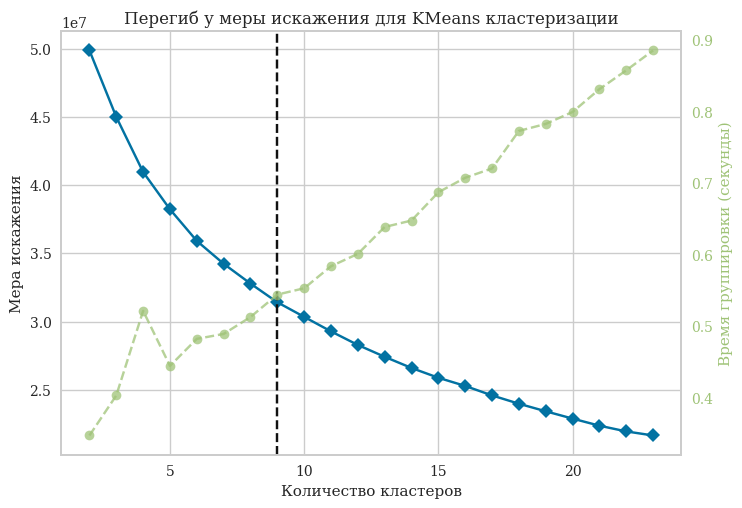

In [ ]:
# Import ElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

swe_depth_c_n = (
    pd.DataFrame()
    .from_dict({gauge_id: cell_dict["c_n"] for gauge_id, cell_dict in swe_depth.items()})
    .T
)
swe_depth_h_n = (
    pd.DataFrame()
    .from_dict({gauge_id: cell_dict["h_n"] for gauge_id, cell_dict in swe_depth.items()})
    .T
)

raw_features = swe_depth_h_n.values

model = KMeans(random_state=42, init="k-means++", n_init=420)
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2, 24), timings=True)
visualizer.fit(raw_features)  # Fit data to visualizer
visualizer.show();


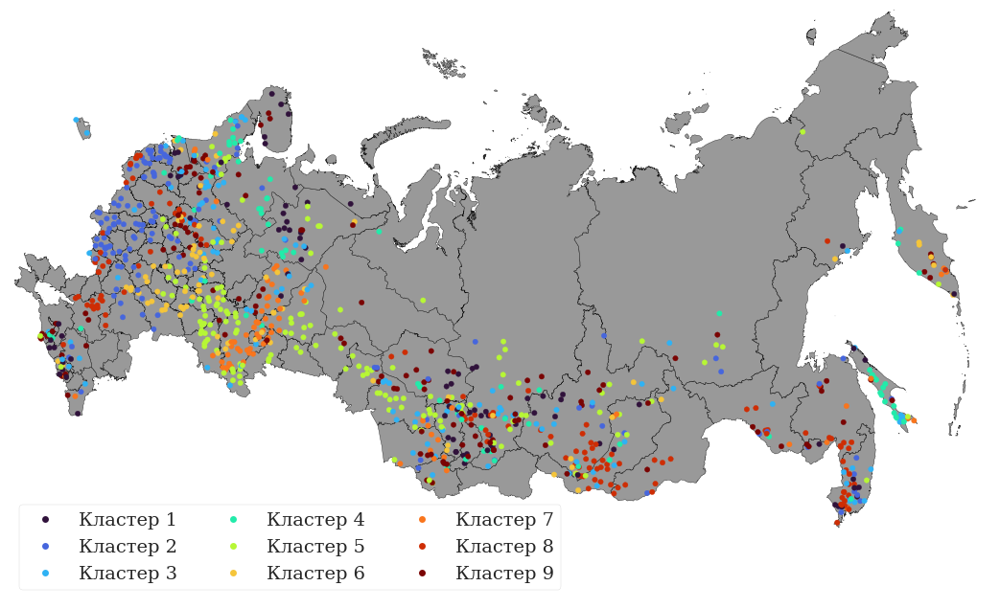

In [ ]:
number_of_clusters = 9

cluster_alg = KMeans(
    n_clusters=number_of_clusters, random_state=42, init="k-means++", n_init=420
)

yhat_AC = cluster_alg.fit_predict(raw_features)
swe_depth_c_n["ResClust"] = [i + 1 for i in yhat_AC]

gauges_file["ResClust"] = np.nan

gauges_file = gauges_file.combine_first(swe_depth_c_n).dropna()
gauges_file["Кластер"] = [f"Кластер {int(i)}" for i in gauges_file["ResClust"]]

gauges_fig = russia_plots(
    gdf_to_plot=gauges_file,
    basemap_data=basemap_data,
    distinction_col="Кластер",
    cmap_name="turbo",
    #   metric_col='Кластер',
    # list_of_limits=list(range(1, 5)),
    figsize=(15, 8),
    just_points=True,
)


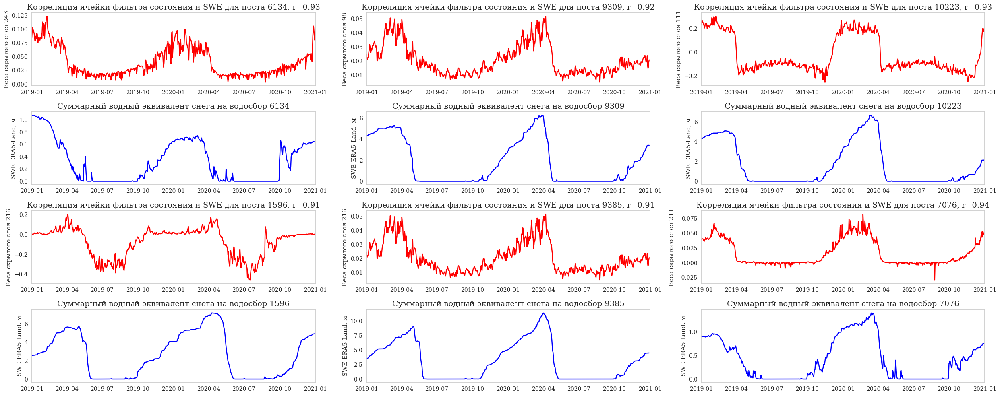

In [ ]:
sample_swe = (
    swe_state.sort_values(by="r фильтр состояния", ascending=False)
    .head(420)
    .sample(n=6, random_state=42)
)


# Create a figure
fig = plt.figure(figsize=(25, 10))

# Define the GridSpec
gs = gridspec.GridSpec(4, 3)

# Add subplots
axs = [fig.add_subplot(gs[i, j]) for i in range(4) for j in range(3)]
cell_axs = [0, 1, 2, 6, 7, 8]
meteo_axs = [3, 4, 5, 9, 10, 11]

for gauge_id, cell_i, meteo_j in zip(sample_swe.index, cell_axs, meteo_axs, strict=False):
    plot_cell = torch.cat(
        [example_states["h_n"][:-1, -1, swe_depth[f"{gauge_id}"]["h_n"][0]]], dim=0
    )
    plot_cell = plot_cell.detach().numpy()

    meteo_array = (
        pd.read_csv(
            f"../data/snow_and_subsurface/era5_land/snow_depth_water_equivalent/{gauge_id}.csv",
            index_col="date",
            parse_dates=["date"],
        )
        .loc[test_date_range.to_numpy()]
        .to_numpy()
        .ravel()
    ) / gauges_file.loc[gauge_id, "new_area"]

    ax_plot(
        gauge_id=f"{gauge_id}",
        cell_ax=axs[cell_i],
        cell_ax_title=f"Корреляция ячейки фильтра состояния и SWE для поста {gauge_id}, r={swe_state.loc[f'{gauge_id}', 'r фильтр состояния']:.2f}",
        cell_ax_ylabel=f"Веса скрытого слоя {swe_depth[gauge_id]['c_n'][0]}",
        meteo_ax=axs[meteo_j],
        meteo_ax_title=f"Суммарный водный эквивалент снега на водосбор {gauge_id}",
        meteo_ax_ylabel="SWE ERA5-Land, м",
        cell_data=plot_cell,
        meteo_data=meteo_array,
        data_range=test_date_range.to_numpy(),
    )

    plt.tight_layout()


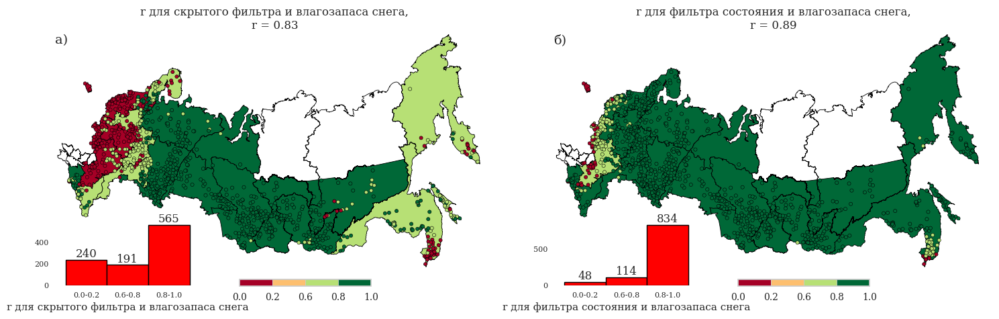

In [ ]:
swe_h_n_r = swe_state["r скрытый фильтр"].median()
swe_c_n_r = swe_state["r фильтр состояния"].median()

for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = swe_state.loc[
        [geom.intersects(gage_point) for gage_point in swe_state["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["r скрытый фильтр", "r фильтр состояния"]] = ugms_part[
        ["r скрытый фильтр", "r фильтр состояния"]
    ].median()

basin_districts.loc[[26, 27], ["r скрытый фильтр", "r фильтр состояния"]] = np.nan

meteo_nse = russia_plots_n(
    gdf_to_plot=swe_state,
    basemap_data=basemap_data,
    figsize=(15, 6),
    nrows=1,
    ncols=2,
    label_list=["а)", "б)"],
    list_of_limits=[0.0, 0.2, 0.6, 0.8, 1.0],
    columns_from_gdf=["r скрытый фильтр", "r фильтр состояния"],
    hist_name=[
        "r для скрытого фильтра и влагозапаса снега",
        "r для фильтра состояния и влагозапаса снега",
    ],
    with_histogram=True,
    title_text=[
        f"r для скрытого фильтра и влагозапаса снега,\nr = {swe_h_n_r:.2f}",
        f"r для фильтра состояния и влагозапаса снега,\nr = {swe_c_n_r:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)


### Cell states vs Sub Surface Flow

In [ ]:
subsurface_state = pd.DataFrame()
subsurface_depth = dict()

for gauge_id in tqdm(gauges_file.index):
    try:
        gauge_cor, gauge_state_cor = lstm_layer_correlation(
            state_dict=example_states,
            date_range=test_date_range.to_numpy(),
            meteo_array=pd.read_csv(
                f"../data/snow_and_subsurface/era5_land/sub_surface_runoff/{gauge_id}.csv",
                index_col="date",
                parse_dates=["date"],
            )
            .loc[test_date_range]
            .to_numpy()
            .ravel(),
            correlation_threshold=0.6,
            data_name="Подземный сток",
        )
        subsurface_state.loc[gauge_id, "r скрытый фильтр"] = gauge_cor["h_n"]
        subsurface_state.loc[gauge_id, "r фильтр состояния"] = gauge_cor["c_n"]
        subsurface_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
        gauge_state_cor = {
            cell: [int(i[0]) for i in vals] for cell, vals in gauge_state_cor.items()
        }
        subsurface_depth[gauge_id] = gauge_state_cor
    except FileNotFoundError:
        subsurface_state.loc[gauge_id, "r скрытый фильтр"] = 0.01
        subsurface_state.loc[gauge_id, "r фильтр состояния"] = 0.01
        subsurface_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
    # subsurface_state.loc[gauge_id, "r "] = gauge_cor["h_n"]
subsurface_state = gpd.GeoDataFrame(
    subsurface_state, geometry="geometry", crs="epsg:4326"
)


  0%|          | 0/996 [00:00<?, ?it/s]

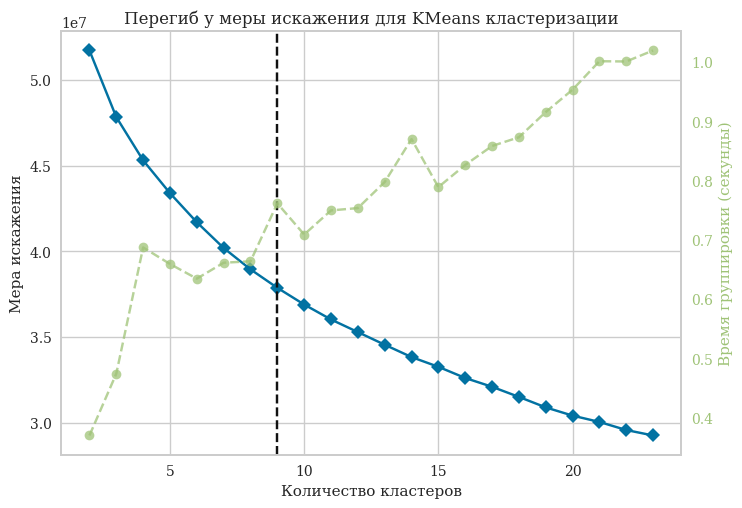

In [ ]:
# Import ElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

subsurface_depth_c_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["c_n"] for gauge_id, cell_dict in subsurface_depth.items()}
    )
    .T
)
subsurface_depth_h_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["h_n"] for gauge_id, cell_dict in subsurface_depth.items()}
    )
    .T
)

raw_features = subsurface_depth_h_n.values

model = KMeans(random_state=42, init="k-means++", n_init=420)
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2, 24), timings=True)
visualizer.fit(raw_features)  # Fit data to visualizer
visualizer.show();


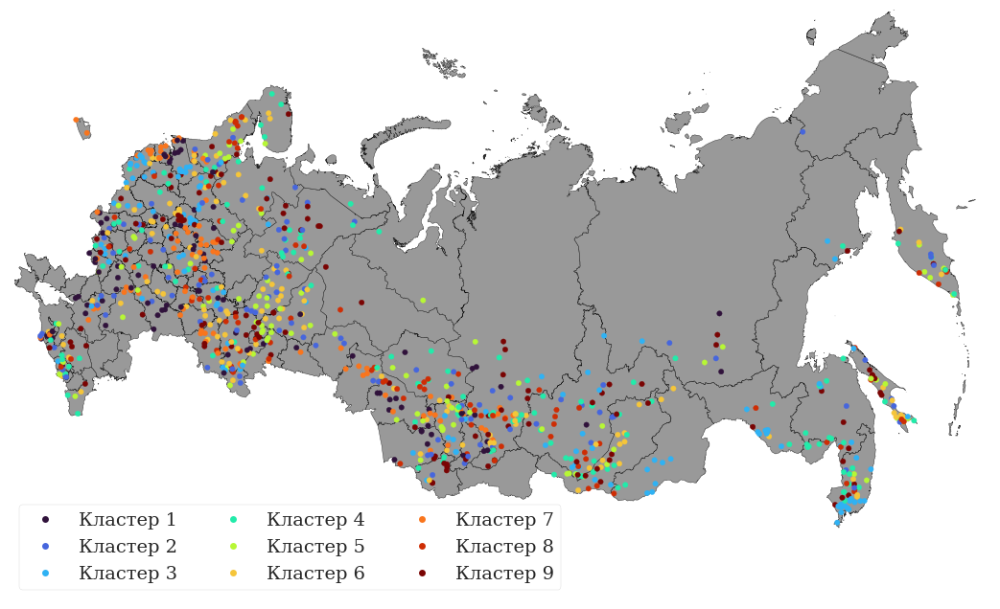

In [ ]:
number_of_clusters = 9

cluster_alg = KMeans(
    n_clusters=number_of_clusters, random_state=42, init="k-means++", n_init=420
)

yhat_AC = cluster_alg.fit_predict(raw_features)
subsurface_depth_h_n["ResClust"] = [i + 1 for i in yhat_AC]

gauges_file["ResClust"] = np.nan

gauges_file = gauges_file.combine_first(subsurface_depth_h_n).dropna()
gauges_file["Кластер"] = [f"Кластер {int(i)}" for i in gauges_file["ResClust"]]

gauges_fig = russia_plots(
    gdf_to_plot=gauges_file,
    basemap_data=basemap_data,
    distinction_col="Кластер",
    cmap_name="turbo",
    #   metric_col='Кластер',
    # list_of_limits=list(range(1, 5)),
    figsize=(15, 8),
    just_points=True,
)


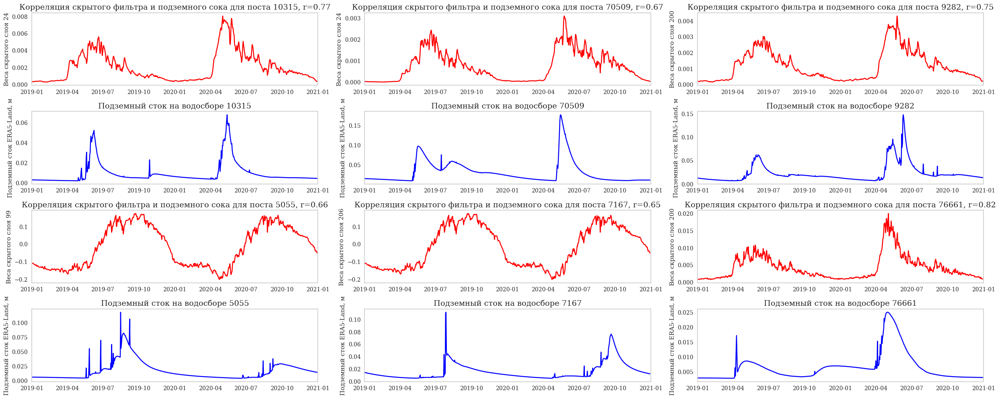

In [ ]:
sample_subsurface = (
    subsurface_state.sort_values(by="r скрытый фильтр", ascending=False)
    .head(420)
    .sample(n=6, random_state=42)
)


# Create a figure
fig = plt.figure(figsize=(25, 10))

# Define the GridSpec
gs = gridspec.GridSpec(4, 3)

# Add subplots
axs = [fig.add_subplot(gs[i, j]) for i in range(4) for j in range(3)]
cell_axs = [0, 1, 2, 6, 7, 8]
meteo_axs = [3, 4, 5, 9, 10, 11]

for gauge_id, cell_i, meteo_j in zip(
    sample_subsurface.index, cell_axs, meteo_axs, strict=False
):
    plot_cell = torch.cat(
        [example_states["h_n"][:-1, -1, subsurface_depth[f"{gauge_id}"]["h_n"][0]]], dim=0
    )
    plot_cell = plot_cell.detach().numpy()

    meteo_array = (
        pd.read_csv(
            f"../data/snow_and_subsurface/era5_land/sub_surface_runoff/{gauge_id}.csv",
            index_col="date",
            parse_dates=["date"],
        )
        .loc[test_date_range.to_numpy()]
        .to_numpy()
        .ravel()
    ) / gauges_file.loc[gauge_id, "new_area"]

    ax_plot(
        gauge_id=f"{gauge_id}",
        cell_ax=axs[cell_i],
        cell_ax_title=f"Корреляция скрытого фильтра и подземного сока для поста {gauge_id}, r={subsurface_state.loc[f'{gauge_id}', 'r скрытый фильтр']:.2f}",
        cell_ax_ylabel=f"Веса скрытого слоя {subsurface_depth[gauge_id]['c_n'][0]}",
        meteo_ax=axs[meteo_j],
        meteo_ax_title=f"Подземный сток на водосборе {gauge_id}",
        meteo_ax_ylabel="Подземный сток ERA5-Land, м",
        cell_data=plot_cell,
        meteo_data=meteo_array,
        data_range=test_date_range.to_numpy(),
    )

    plt.tight_layout()


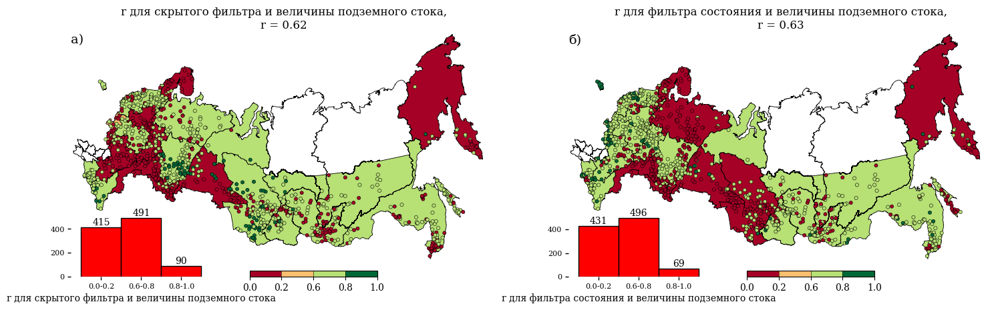

In [62]:
subsurface_h_n_r = subsurface_state["r скрытый фильтр"].median()
subsurface_c_n_r = subsurface_state["r фильтр состояния"].median()

for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = subsurface_state.loc[
        [geom.intersects(gage_point) for gage_point in subsurface_state["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["r скрытый фильтр", "r фильтр состояния"]] = ugms_part[
        ["r скрытый фильтр", "r фильтр состояния"]
    ].median()

basin_districts.loc[[26, 27], ["r скрытый фильтр", "r фильтр состояния"]] = np.nan

meteo_nse = russia_plots_n(
    gdf_to_plot=subsurface_state,
    basemap_data=basemap_data,
    figsize=(15, 6),
    nrows=1,
    ncols=2,
    label_list=["а)", "б)"],
    list_of_limits=[0.0, 0.2, 0.6, 0.8, 1.0],
    columns_from_gdf=["r скрытый фильтр", "r фильтр состояния"],
    hist_name=[
        "r для скрытого фильтра и величины подземного стока",
        "r для фильтра состояния и величины подземного стока",
    ],
    with_histogram=True,
    title_text=[
        f"r для скрытого фильтра и величины подземного стока,\nr = {subsurface_h_n_r:.2f}",
        f"r для фильтра состояния и величины подземного стока,\nr = {subsurface_c_n_r:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)


### Cell states vs Snow depth

In [ ]:
snow_depth_state = pd.DataFrame()
snow_depth_depth = dict()

for gauge_id in tqdm(gauges_file.index):
    try:
        gauge_cor, gauge_state_cor = lstm_layer_correlation(
            state_dict=example_states,
            date_range=test_date_range.to_numpy(),
            meteo_array=pd.read_csv(
                f"../data/snow_and_subsurface/era5_land/snow_depth/{gauge_id}.csv",
                index_col="date",
                parse_dates=["date"],
            )
            .loc[test_date_range]
            .to_numpy()
            .ravel(),
            correlation_threshold=0.6,
            data_name="Подземный сток",
        )
        snow_depth_state.loc[gauge_id, "r скрытый фильтр"] = gauge_cor["h_n"]
        snow_depth_state.loc[gauge_id, "r фильтр состояния"] = gauge_cor["c_n"]
        snow_depth_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
        gauge_state_cor = {
            cell: [int(i[0]) for i in vals] for cell, vals in gauge_state_cor.items()
        }
        snow_depth_depth[gauge_id] = gauge_state_cor
    except FileNotFoundError:
        snow_depth_state.loc[gauge_id, "r скрытый фильтр"] = 0.01
        snow_depth_state.loc[gauge_id, "r фильтр состояния"] = 0.01
        snow_depth_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
    # snow_depth_state.loc[gauge_id, "r "] = gauge_cor["h_n"]
snow_depth_state = gpd.GeoDataFrame(
    snow_depth_state, geometry="geometry", crs="epsg:4326"
)


  0%|          | 0/996 [00:00<?, ?it/s]

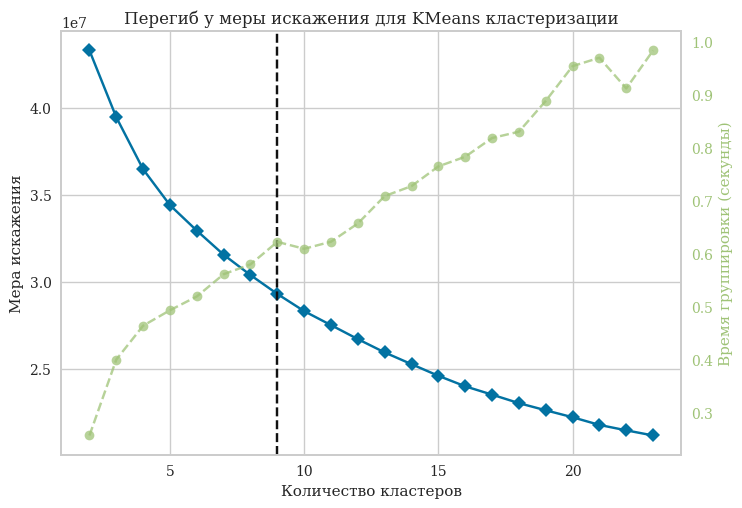

In [ ]:
# Import ElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

snow_depth_depth_c_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["c_n"] for gauge_id, cell_dict in snow_depth_depth.items()}
    )
    .T
)
snow_depth_depth_h_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["h_n"] for gauge_id, cell_dict in snow_depth_depth.items()}
    )
    .T
)

raw_features = snow_depth_depth_c_n.values

model = KMeans(random_state=42, init="k-means++", n_init=420)
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2, 24), timings=True)
visualizer.fit(raw_features)  # Fit data to visualizer
visualizer.show();


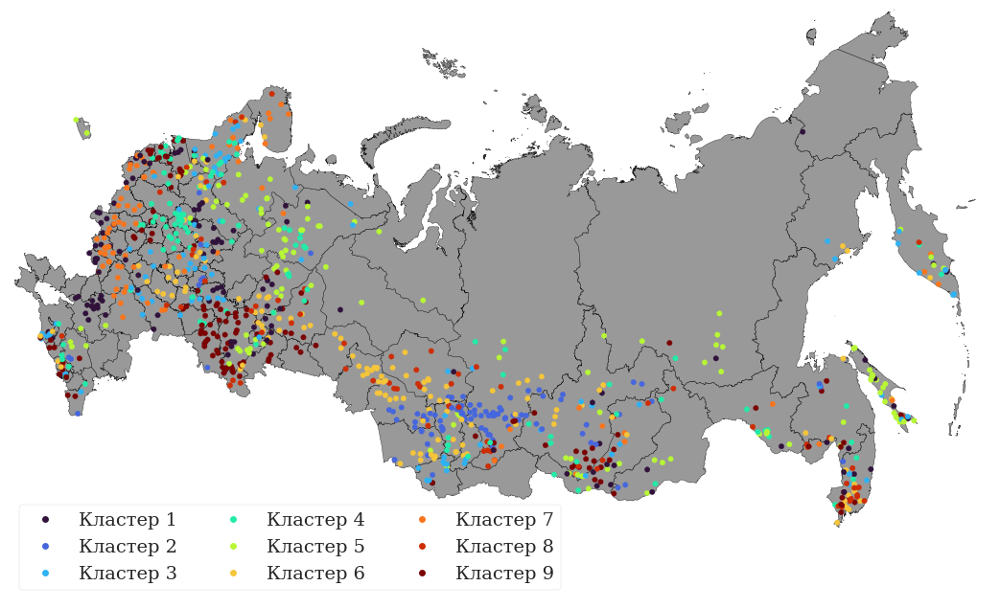

In [ ]:
number_of_clusters = 9

cluster_alg = KMeans(
    n_clusters=number_of_clusters, random_state=42, init="k-means++", n_init=420
)

yhat_AC = cluster_alg.fit_predict(raw_features)
subsurface_depth_h_n["ResClust"] = [i + 1 for i in yhat_AC]

gauges_file["ResClust"] = np.nan

gauges_file = gauges_file.combine_first(subsurface_depth_h_n).dropna()
gauges_file["Кластер"] = [f"Кластер {int(i)}" for i in gauges_file["ResClust"]]

gauges_fig = russia_plots(
    gdf_to_plot=gauges_file,
    basemap_data=basemap_data,
    distinction_col="Кластер",
    cmap_name="turbo",
    #   metric_col='Кластер',
    # list_of_limits=list(range(1, 5)),
    figsize=(15, 8),
    just_points=True,
)


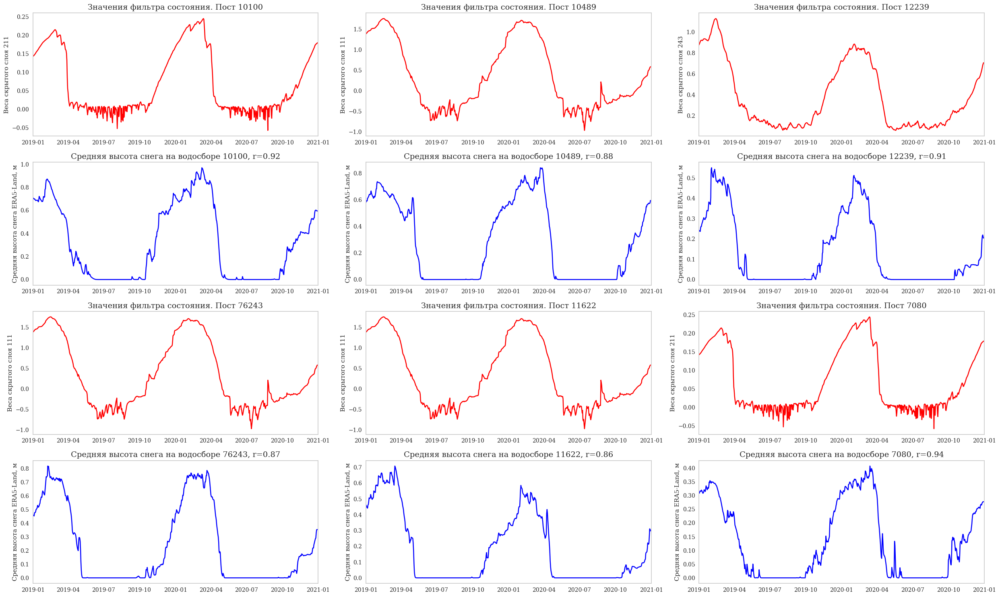

In [ ]:
sample_snow_depth = (
    snow_depth_state.sort_values(by="r скрытый фильтр", ascending=False)
    .head(420)
    .sample(n=6, random_state=42)
)


# Create a figure
fig = plt.figure(figsize=(25, 15))

# Define the GridSpec
gs = gridspec.GridSpec(4, 3)

# Add subplots
axs = [fig.add_subplot(gs[i, j]) for i in range(4) for j in range(3)]
cell_axs = [0, 1, 2, 6, 7, 8]
meteo_axs = [3, 4, 5, 9, 10, 11]

for gauge_id, cell_i, meteo_j in zip(
    sample_snow_depth.index, cell_axs, meteo_axs, strict=False
):
    plot_cell = torch.cat(
        [example_states["c_n"][:-1, -1, snow_depth_depth[f"{gauge_id}"]["c_n"][0]]], dim=0
    )
    plot_cell = plot_cell.detach().numpy()

    meteo_array = (
        pd.read_csv(
            f"../data/snow_and_subsurface/era5_land/snow_depth/{gauge_id}.csv",
            index_col="date",
            parse_dates=["date"],
        )
        .loc[test_date_range.to_numpy()]
        .to_numpy()
        .ravel()
    )

    ax_plot(
        gauge_id=f"{gauge_id}",
        cell_ax=axs[cell_i],
        cell_ax_title=f"Значения фильтра состояния. Пост {gauge_id}",
        cell_ax_ylabel=f"Веса скрытого слоя {snow_depth_depth[gauge_id]['c_n'][0]}",
        meteo_ax=axs[meteo_j],
        meteo_ax_title=f"Средняя высота снега на водосборе {gauge_id}, r={snow_depth_state.loc[f'{gauge_id}', 'r скрытый фильтр']:.2f}",
        meteo_ax_ylabel="Средняя высота снега ERA5-Land, м",
        cell_data=plot_cell,
        meteo_data=meteo_array,
        data_range=test_date_range.to_numpy(),
    )

    plt.tight_layout()


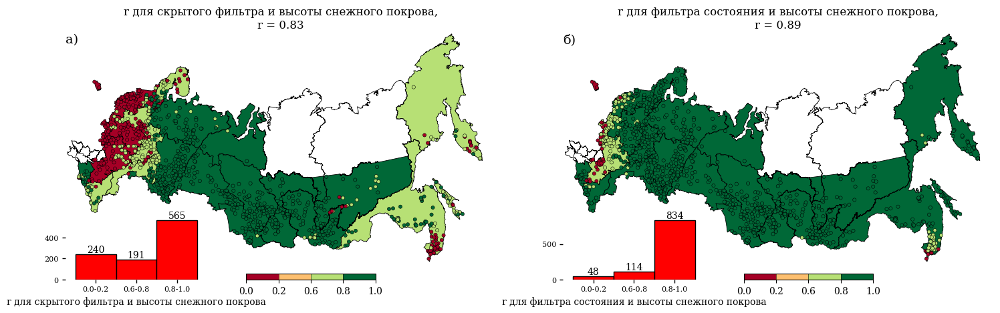

In [64]:
snow_depth_h_n_r = snow_depth_state["r скрытый фильтр"].median()
snow_depth_c_n_r = snow_depth_state["r фильтр состояния"].median()

for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = snow_depth_state.loc[
        [geom.intersects(gage_point) for gage_point in snow_depth_state["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["r скрытый фильтр", "r фильтр состояния"]] = ugms_part[
        ["r скрытый фильтр", "r фильтр состояния"]
    ].median()

basin_districts.loc[[26, 27], ["r скрытый фильтр", "r фильтр состояния"]] = np.nan

meteo_nse = russia_plots_n(
    gdf_to_plot=snow_depth_state,
    basemap_data=basemap_data,
    figsize=(15, 6),
    nrows=1,
    ncols=2,
    label_list=["а)", "б)"],
    list_of_limits=[0.0, 0.2, 0.6, 0.8, 1.0],
    columns_from_gdf=["r скрытый фильтр", "r фильтр состояния"],
    hist_name=[
        "r для скрытого фильтра и высоты снежного покрова",
        "r для фильтра состояния и высоты снежного покрова",
    ],
    with_histogram=True,
    title_text=[
        f"r для скрытого фильтра и высоты снежного покрова,\nr = {snow_depth_h_n_r:.2f}",
        f"r для фильтра состояния и высоты снежного покрова,\nr = {snow_depth_c_n_r:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)


## 128 hidden size

In [ ]:
config_file = Path(
    "../data/lstm_configs/model_runs/cudalstm_q_mm_day_128_mswep_static_1405_112752/config.yml"
)

cudalstm_config = Config(config_file)

# create a new model instance with random weights
cuda_lstm = CudaLSTM(cfg=cudalstm_config)

# load the trained weights into the new model.
model_path = cudalstm_config.run_dir / "model_epoch024.pt"
model_weights = torch.load(
    str(model_path), map_location="cpu"
)  # load the weights from the file, creating the weight tensors on CPU
cuda_lstm.load_state_dict(
    model_weights
)  # set the new model's weights to the values loaded from file
custom_lstm = CustomLSTM(
    cfg=cudalstm_config
)  # create a new CustomLSTM (with random weights)
custom_lstm.copy_weights(cuda_lstm)  # copy the CudaLSTM weights into the CustomLSTM
# make sure we're in eval mode where dropout is deactivated
custom_lstm.eval()

# load the dataset
scaler = load_scaler(cudalstm_config.run_dir)
dataset = get_dataset(cudalstm_config, is_train=False, period="test", scaler=scaler)
dataloader = DataLoader(
    dataset, batch_size=731, shuffle=False, collate_fn=dataset.collate_fn
)

example_states = custom_lstm(next(iter(dataloader)))
example_states.keys()


dict_keys(['h_n', 'c_n', 'i', 'f', 'g', 'o', 'y_hat'])

### Evaporation

In [ ]:
evaporation_state = pd.DataFrame()
evaporation_depth = dict()

for gauge_id in tqdm(gauges_file.index):
    try:
        gauge_cor, gauge_state_cor = lstm_layer_correlation(
            state_dict=example_states,
            date_range=test_date_range.to_numpy(),
            meteo_array=pd.read_csv(
                f"../data/meteo_grids_2024/gleam/E/{gauge_id}.csv",
                index_col="date",
                parse_dates=["date"],
            )
            .loc[test_date_range]
            .to_numpy()
            .ravel(),
            correlation_threshold=0.7,
            data_name="Испарение",
            draw_plot=False,
            # interest_states=("c_n"),
        )
        evaporation_state.loc[gauge_id, "r скрытый фильтр"] = gauge_cor["h_n"]
        evaporation_state.loc[gauge_id, "r фильтр состояния"] = gauge_cor["c_n"]
        evaporation_state.loc[gauge_id, "geometry"] = gauges_file.loc[
            gauge_id, "geometry"
        ]
        gauge_state_cor = {
            cell: [int(i[0]) for i in vals] for cell, vals in gauge_state_cor.items()
        }
        evaporation_depth[gauge_id] = gauge_state_cor
    except FileNotFoundError:
        evaporation_state.loc[gauge_id, "r скрытый фильтр"] = 0.01
        evaporation_state.loc[gauge_id, "r фильтр состояния"] = 0.01
        evaporation_state.loc[gauge_id, "geometry"] = gauges_file.loc[
            gauge_id, "geometry"
        ]
    # evaporation_state.loc[gauge_id, "r "] = gauge_cor["h_n"]
evaporation_state = gpd.GeoDataFrame(
    evaporation_state, geometry="geometry", crs="epsg:4326"
)


  0%|          | 0/996 [00:00<?, ?it/s]

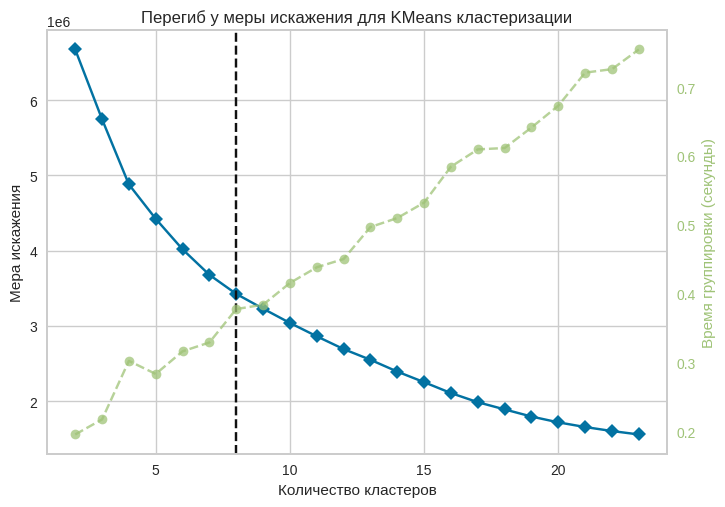

In [ ]:
# Import ElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

evaporation_depth_c_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["c_n"] for gauge_id, cell_dict in evaporation_depth.items()}
    )
    .T
)
evaporation_depth_h_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["h_n"] for gauge_id, cell_dict in evaporation_depth.items()}
    )
    .T
)

raw_features = evaporation_depth_c_n.values

model = KMeans(random_state=42, init="k-means++", n_init=420)
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2, 24), timings=True)
visualizer.fit(raw_features)  # Fit data to visualizer
visualizer.show();


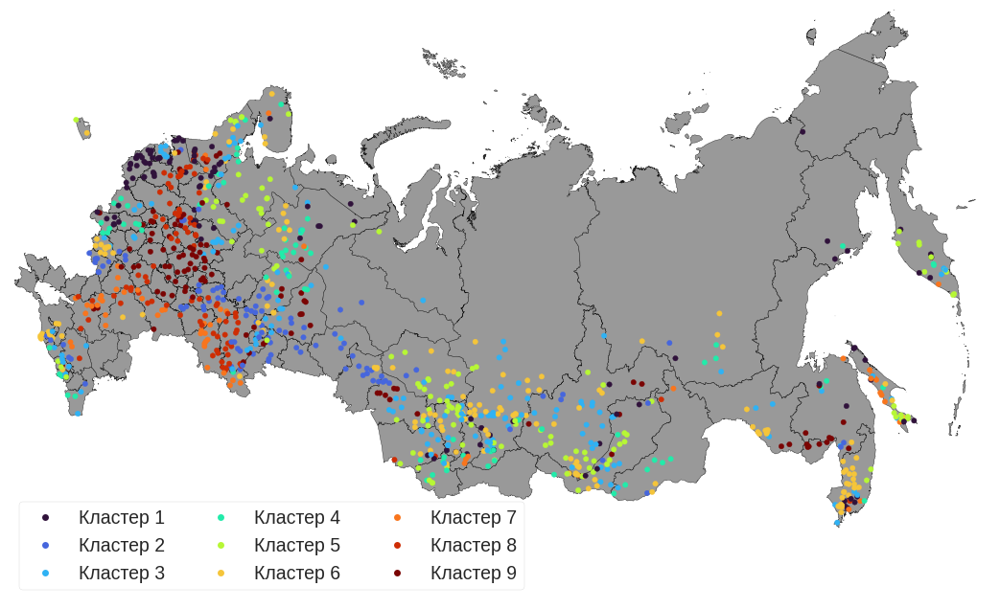

In [ ]:
number_of_clusters = 9
raw_features = evaporation_depth_h_n.values
cluster_alg = KMeans(
    n_clusters=number_of_clusters, random_state=42, init="k-means++", n_init=420
)

yhat_AC = cluster_alg.fit_predict(raw_features)
evaporation_depth_h_n["ResClust"] = [i + 1 for i in yhat_AC]

gauges_file["ResClust"] = np.nan

gauges_file = gauges_file.combine_first(evaporation_depth_h_n).dropna()
gauges_file["Кластер"] = [f"Кластер {int(i)}" for i in gauges_file["ResClust"]]

gauges_fig = russia_plots(
    gdf_to_plot=gauges_file,
    basemap_data=basemap_data,
    distinction_col="Кластер",
    cmap_name="turbo",
    #   metric_col='Кластер',
    # list_of_limits=list(range(1, 5)),
    figsize=(15, 8),
    just_points=True,
)


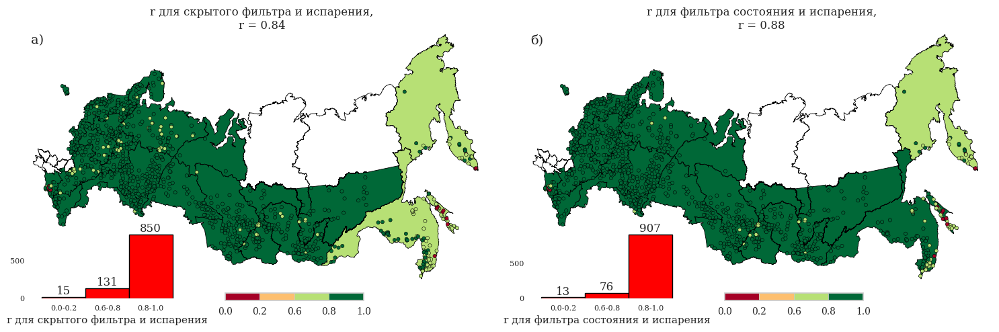

In [ ]:
evaporation_h_n_r = evaporation_state["r скрытый фильтр"].median()
evaporation_c_n_r = evaporation_state["r фильтр состояния"].median()

for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = evaporation_state.loc[
        [geom.intersects(gage_point) for gage_point in evaporation_state["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["r скрытый фильтр", "r фильтр состояния"]] = ugms_part[
        ["r скрытый фильтр", "r фильтр состояния"]
    ].median()

basin_districts.loc[[26, 27], ["r скрытый фильтр", "r фильтр состояния"]] = np.nan

meteo_nse = russia_plots_n(
    gdf_to_plot=evaporation_state,
    basemap_data=basemap_data,
    figsize=(15, 6),
    nrows=1,
    ncols=2,
    label_list=["а)", "б)"],
    list_of_limits=[0.0, 0.2, 0.6, 0.8, 1.0],
    columns_from_gdf=["r скрытый фильтр", "r фильтр состояния"],
    hist_name=[
        "r для скрытого фильтра и испарения",
        "r для фильтра состояния и испарения",
    ],
    with_histogram=True,
    title_text=[
        f"r для скрытого фильтра и испарения,\nr = {evaporation_h_n_r:.2f}",
        f"r для фильтра состояния и испарения,\nr = {evaporation_c_n_r:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)


In [38]:
plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]


In [40]:
def ax_plot(
    gauge_id,
    cell_ax,
    meteo_ax,
    cell_data,
    meteo_data,
    data_range,
    cell_ax_title: str,
    cell_ax_ylabel: str,
    meteo_ax_title: str,
    meteo_ax_ylabel: str,
):
    cell_ax.plot(data_range, cell_data, c="red")
    cell_ax.set_ylabel(cell_ax_ylabel)
    cell_ax.set_title(
        cell_ax_title,
        fontsize=14,
    )
    cell_ax.set_xlim([pd.to_datetime("01/01/2019"), pd.to_datetime("01/01/2021")])
    cell_ax.grid(False)

    meteo_ax.plot(data_range, meteo_data, c="blue")
    meteo_ax.set_ylabel(meteo_ax_ylabel)
    meteo_ax.set_title(
        meteo_ax_title,
        fontsize=14,
    )
    meteo_ax.set_xlim([pd.to_datetime("01/01/2019"), pd.to_datetime("01/01/2021")])
    meteo_ax.grid(False)

    return None


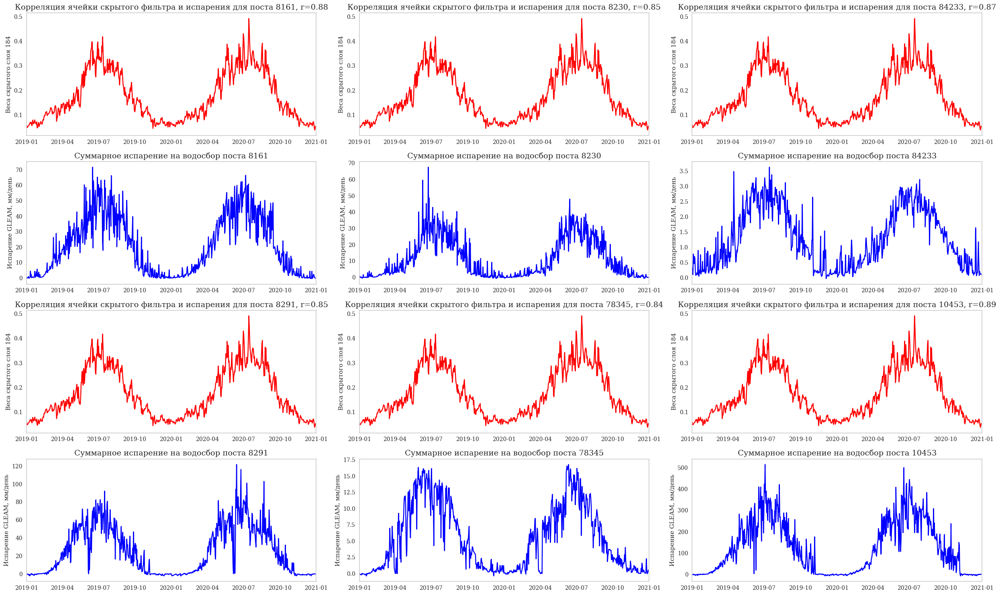

In [ ]:
sample_evap = (
    evaporation_state.sort_values(by="r скрытый фильтр", ascending=False)
    .head(420)
    .sample(n=6, random_state=42)
)


# Create a figure
fig = plt.figure(figsize=(25, 15))

# Define the GridSpec
gs = gridspec.GridSpec(4, 3)
cell_axs = [0, 1, 2, 6, 7, 8]
meteo_axs = [3, 4, 5, 9, 10, 11]
# Add subplots
axs = [fig.add_subplot(gs[i, j]) for i in range(4) for j in range(3)]

for gauge_id, cell_i, meteo_j in zip(
    sample_evap.index, cell_axs, meteo_axs, strict=False
):
    plot_cell = torch.cat(
        [example_states["h_n"][:-1, -1, evaporation_depth[f"{gauge_id}"]["h_n"][0]]],
        dim=0,
    )
    plot_cell = plot_cell.detach().numpy()

    meteo_array = (
        pd.read_csv(
            f"../data/meteo_grids_2024/gleam/E/{gauge_id}.csv",
            index_col="date",
            parse_dates=["date"],
        )
        .loc[test_date_range.to_numpy()]
        .to_numpy()
        .ravel()
    )

    ax_plot(
        gauge_id=f"{gauge_id}",
        cell_ax=axs[cell_i],
        cell_ax_title=f"Корреляция ячейки скрытого фильтра и испарения для поста {gauge_id}, r={evaporation_state.loc[f'{gauge_id}', 'r скрытый фильтр']:.2f}",
        cell_ax_ylabel=f"Веса скрытого слоя {evaporation_depth[gauge_id]['h_n'][0]}",
        meteo_ax=axs[meteo_j],
        meteo_ax_title=f"Суммарное испарение на водосбор поста {gauge_id}",
        meteo_ax_ylabel="Испарение GLEAM, мм/день",
        cell_data=plot_cell,
        meteo_data=meteo_array,
        data_range=test_date_range.to_numpy(),
    )

    plt.tight_layout()


### SWE

In [ ]:
swe_state = pd.DataFrame()
swe_depth = dict()

for gauge_id in tqdm(gauges_file.index):
    try:
        gauge_cor, gauge_state_cor = lstm_layer_correlation(
            state_dict=example_states,
            date_range=test_date_range.to_numpy(),
            meteo_array=pd.read_csv(
                f"../data/snow_and_subsurface/era5_land/snow_depth_water_equivalent/{gauge_id}.csv",
                index_col="date",
                parse_dates=["date"],
            )
            .loc[test_date_range]
            .to_numpy()
            .ravel(),
            correlation_threshold=0.7,
            data_name="Обводненность снежного покрова",
        )
        swe_state.loc[gauge_id, "r скрытый фильтр"] = gauge_cor["h_n"]
        swe_state.loc[gauge_id, "r фильтр состояния"] = gauge_cor["c_n"]
        swe_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
        gauge_state_cor = {
            cell: [int(i[0]) for i in vals] for cell, vals in gauge_state_cor.items()
        }
        swe_depth[gauge_id] = gauge_state_cor
    except FileNotFoundError:
        swe_state.loc[gauge_id, "r скрытый фильтр"] = 0.01
        swe_state.loc[gauge_id, "r фильтр состояния"] = 0.01
        swe_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
    # swe_state.loc[gauge_id, "r "] = gauge_cor["h_n"]
swe_state = gpd.GeoDataFrame(swe_state, geometry="geometry", crs="epsg:4326")

  0%|          | 0/996 [00:00<?, ?it/s]

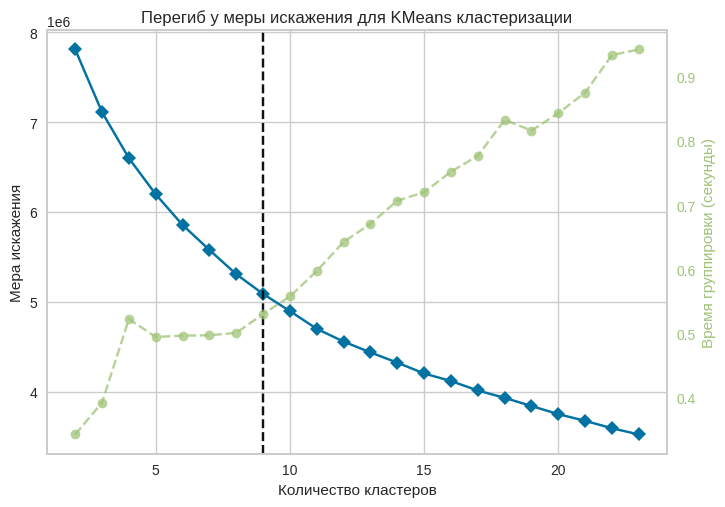

In [ ]:
# Import ElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

swe_depth_c_n = (
    pd.DataFrame()
    .from_dict({gauge_id: cell_dict["c_n"] for gauge_id, cell_dict in swe_depth.items()})
    .T
)
swe_depth_h_n = (
    pd.DataFrame()
    .from_dict({gauge_id: cell_dict["h_n"] for gauge_id, cell_dict in swe_depth.items()})
    .T
)

raw_features = swe_depth_h_n.values

model = KMeans(random_state=42, init="k-means++", n_init=420)
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2, 24), timings=True)
visualizer.fit(raw_features)  # Fit data to visualizer
visualizer.show();


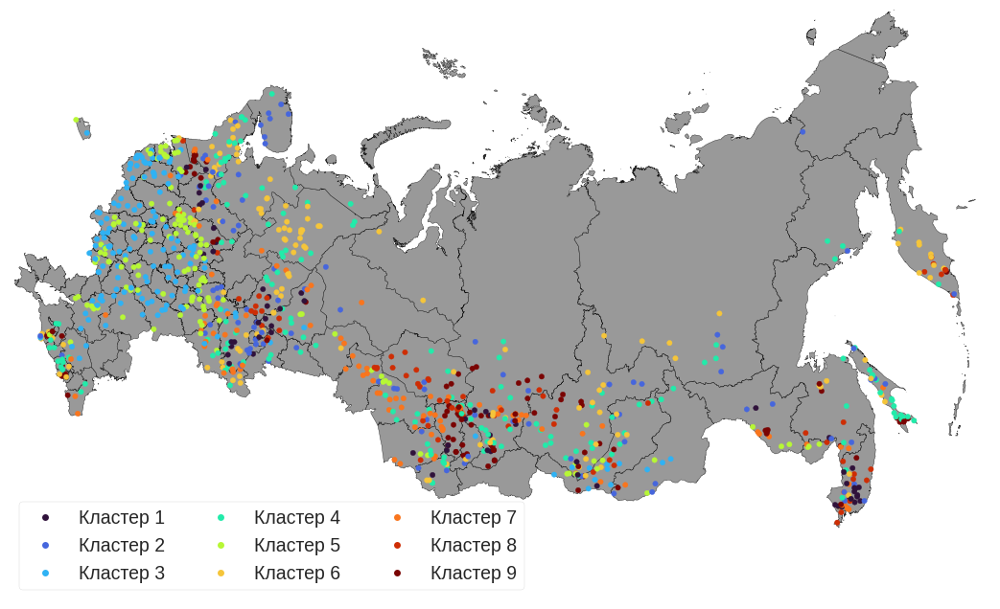

In [ ]:
number_of_clusters = 9

cluster_alg = KMeans(
    n_clusters=number_of_clusters, random_state=42, init="k-means++", n_init=420
)

yhat_AC = cluster_alg.fit_predict(raw_features)
swe_depth_c_n["ResClust"] = [i + 1 for i in yhat_AC]

gauges_file["ResClust"] = np.nan

gauges_file = gauges_file.combine_first(swe_depth_c_n).dropna()
gauges_file["Кластер"] = [f"Кластер {int(i)}" for i in gauges_file["ResClust"]]

gauges_fig = russia_plots(
    gdf_to_plot=gauges_file,
    basemap_data=basemap_data,
    distinction_col="Кластер",
    cmap_name="turbo",
    #   metric_col='Кластер',
    # list_of_limits=list(range(1, 5)),
    figsize=(15, 8),
    just_points=True,
)


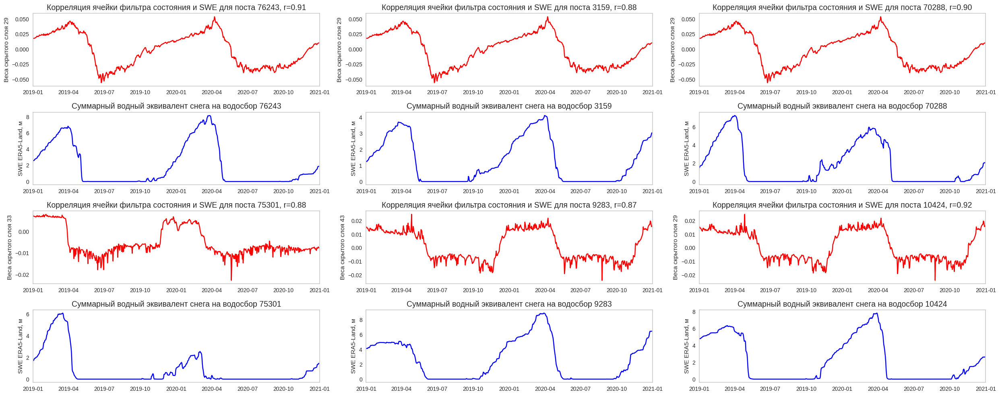

In [ ]:
sample_swe = (
    swe_state.sort_values(by="r фильтр состояния", ascending=False)
    .head(420)
    .sample(n=6, random_state=42)
)


# Create a figure
fig = plt.figure(figsize=(25, 10))

# Define the GridSpec
gs = gridspec.GridSpec(4, 3)

# Add subplots
axs = [fig.add_subplot(gs[i, j]) for i in range(4) for j in range(3)]
cell_axs = [0, 1, 2, 6, 7, 8]
meteo_axs = [3, 4, 5, 9, 10, 11]

for gauge_id, cell_i, meteo_j in zip(sample_swe.index, cell_axs, meteo_axs, strict=False):
    plot_cell = torch.cat(
        [example_states["h_n"][:-1, -1, swe_depth[f"{gauge_id}"]["h_n"][0]]], dim=0
    )
    plot_cell = plot_cell.detach().numpy()

    meteo_array = (
        pd.read_csv(
            f"../data/snow_and_subsurface/era5_land/snow_depth_water_equivalent/{gauge_id}.csv",
            index_col="date",
            parse_dates=["date"],
        )
        .loc[test_date_range.to_numpy()]
        .to_numpy()
        .ravel()
    ) / gauges_file.loc[gauge_id, "new_area"]

    ax_plot(
        gauge_id=f"{gauge_id}",
        cell_ax=axs[cell_i],
        cell_ax_title=f"Корреляция ячейки фильтра состояния и SWE для поста {gauge_id}, r={swe_state.loc[f'{gauge_id}', 'r фильтр состояния']:.2f}",
        cell_ax_ylabel=f"Веса скрытого слоя {swe_depth[gauge_id]['c_n'][0]}",
        meteo_ax=axs[meteo_j],
        meteo_ax_title=f"Суммарный водный эквивалент снега на водосбор {gauge_id}",
        meteo_ax_ylabel="SWE ERA5-Land, м",
        cell_data=plot_cell,
        meteo_data=meteo_array,
        data_range=test_date_range.to_numpy(),
    )

    plt.tight_layout()


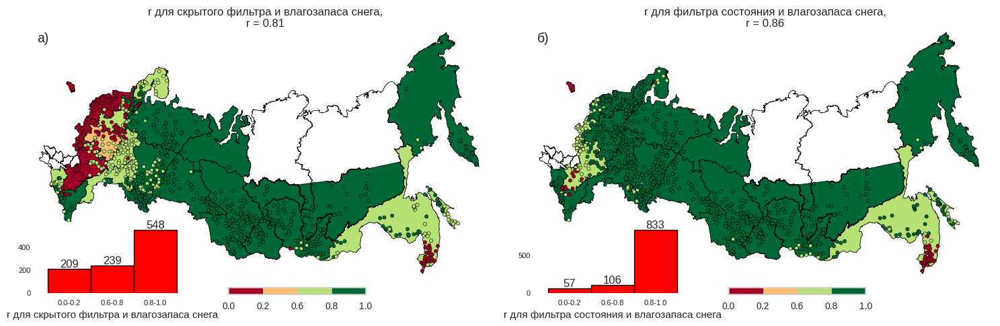

In [ ]:
swe_h_n_r = swe_state["r скрытый фильтр"].median()
swe_c_n_r = swe_state["r фильтр состояния"].median()

for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = swe_state.loc[
        [geom.intersects(gage_point) for gage_point in swe_state["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["r скрытый фильтр", "r фильтр состояния"]] = ugms_part[
        ["r скрытый фильтр", "r фильтр состояния"]
    ].median()

basin_districts.loc[[26, 27], ["r скрытый фильтр", "r фильтр состояния"]] = np.nan

meteo_nse = russia_plots_n(
    gdf_to_plot=swe_state,
    basemap_data=basemap_data,
    figsize=(15, 6),
    nrows=1,
    ncols=2,
    label_list=["а)", "б)"],
    list_of_limits=[0.0, 0.2, 0.6, 0.8, 1.0],
    columns_from_gdf=["r скрытый фильтр", "r фильтр состояния"],
    hist_name=[
        "r для скрытого фильтра и влагозапаса снега",
        "r для фильтра состояния и влагозапаса снега",
    ],
    with_histogram=True,
    title_text=[
        f"r для скрытого фильтра и влагозапаса снега,\nr = {swe_h_n_r:.2f}",
        f"r для фильтра состояния и влагозапаса снега,\nr = {swe_c_n_r:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)


### Subsurface

In [ ]:
subsurface_state = pd.DataFrame()
subsurface_depth = dict()

for gauge_id in tqdm(gauges_file.index):
    try:
        gauge_cor, gauge_state_cor = lstm_layer_correlation(
            state_dict=example_states,
            date_range=test_date_range.to_numpy(),
            meteo_array=pd.read_csv(
                f"../data/snow_and_subsurface/era5_land/sub_surface_runoff/{gauge_id}.csv",
                index_col="date",
                parse_dates=["date"],
            )
            .loc[test_date_range]
            .to_numpy()
            .ravel(),
            correlation_threshold=0.6,
            data_name="Подземный сток",
        )
        subsurface_state.loc[gauge_id, "r скрытый фильтр"] = gauge_cor["h_n"]
        subsurface_state.loc[gauge_id, "r фильтр состояния"] = gauge_cor["c_n"]
        subsurface_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
        gauge_state_cor = {
            cell: [int(i[0]) for i in vals] for cell, vals in gauge_state_cor.items()
        }
        subsurface_depth[gauge_id] = gauge_state_cor
    except FileNotFoundError:
        subsurface_state.loc[gauge_id, "r скрытый фильтр"] = 0.01
        subsurface_state.loc[gauge_id, "r фильтр состояния"] = 0.01
        subsurface_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
    # subsurface_state.loc[gauge_id, "r "] = gauge_cor["h_n"]
subsurface_state = gpd.GeoDataFrame(
    subsurface_state, geometry="geometry", crs="epsg:4326"
)


  0%|          | 0/996 [00:00<?, ?it/s]

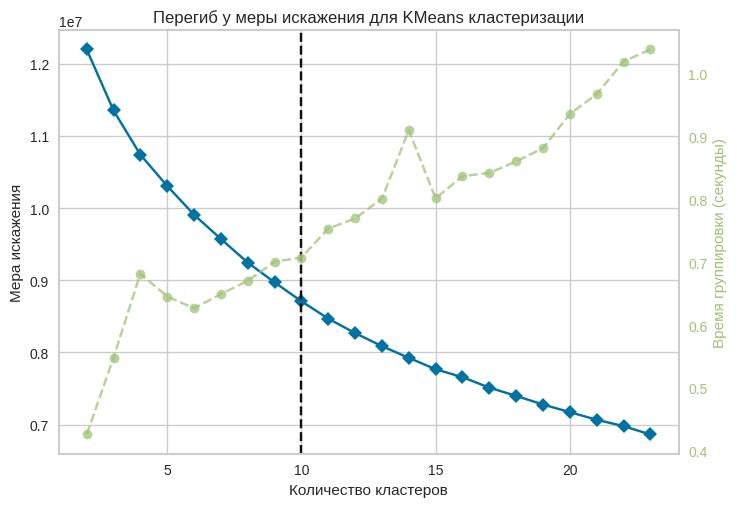

In [ ]:
# Import ElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

subsurface_depth_c_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["c_n"] for gauge_id, cell_dict in subsurface_depth.items()}
    )
    .T
)
subsurface_depth_h_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["h_n"] for gauge_id, cell_dict in subsurface_depth.items()}
    )
    .T
)

raw_features = subsurface_depth_h_n.values

model = KMeans(random_state=42, init="k-means++", n_init=420)
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2, 24), timings=True)
visualizer.fit(raw_features)  # Fit data to visualizer
visualizer.show();


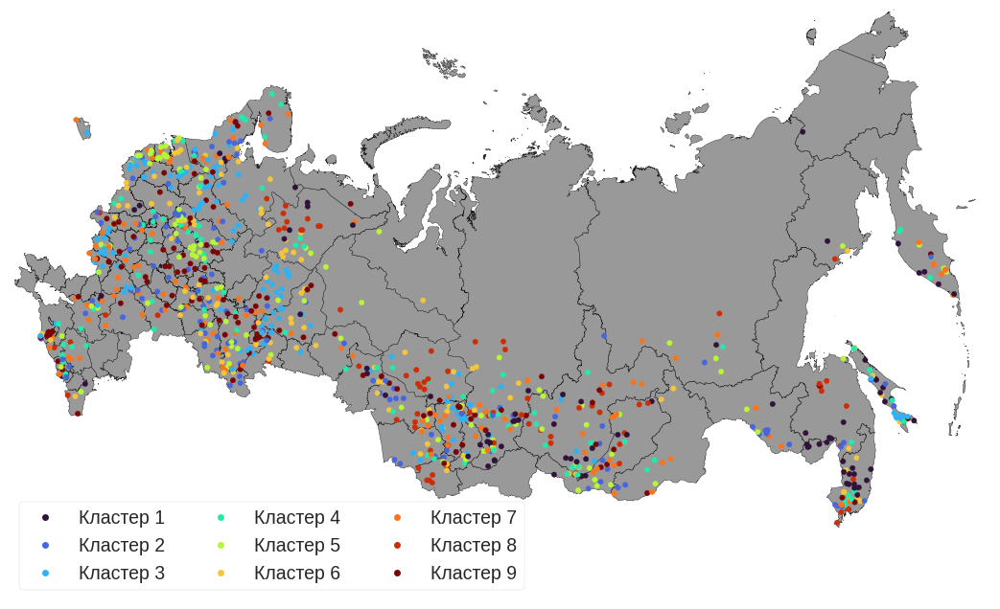

In [ ]:
number_of_clusters = 9

cluster_alg = KMeans(
    n_clusters=number_of_clusters, random_state=42, init="k-means++", n_init=420
)

yhat_AC = cluster_alg.fit_predict(raw_features)
subsurface_depth_c_n["ResClust"] = [i + 1 for i in yhat_AC]

gauges_file["ResClust"] = np.nan

gauges_file = gauges_file.combine_first(subsurface_depth_c_n).dropna()
gauges_file["Кластер"] = [f"Кластер {int(i)}" for i in gauges_file["ResClust"]]

gauges_fig = russia_plots(
    gdf_to_plot=gauges_file,
    basemap_data=basemap_data,
    distinction_col="Кластер",
    cmap_name="turbo",
    #   metric_col='Кластер',
    # list_of_limits=list(range(1, 5)),
    figsize=(15, 8),
    just_points=True,
)


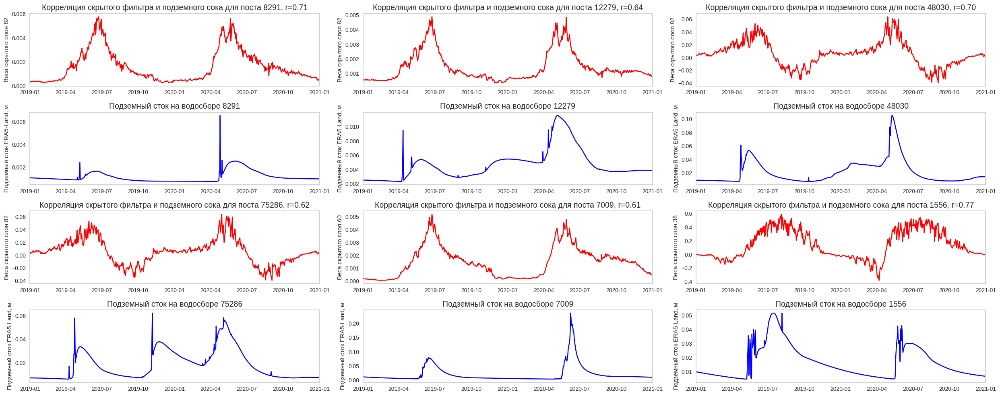

In [ ]:
sample_subsurface = (
    subsurface_state.sort_values(by="r скрытый фильтр", ascending=False)
    .head(420)
    .sample(n=6, random_state=42)
)


# Create a figure
fig = plt.figure(figsize=(25, 10))

# Define the GridSpec
gs = gridspec.GridSpec(4, 3)

# Add subplots
axs = [fig.add_subplot(gs[i, j]) for i in range(4) for j in range(3)]
cell_axs = [0, 1, 2, 6, 7, 8]
meteo_axs = [3, 4, 5, 9, 10, 11]

for gauge_id, cell_i, meteo_j in zip(
    sample_subsurface.index, cell_axs, meteo_axs, strict=False
):
    plot_cell = torch.cat(
        [example_states["h_n"][:-1, -1, subsurface_depth[f"{gauge_id}"]["h_n"][0]]], dim=0
    )
    plot_cell = plot_cell.detach().numpy()

    meteo_array = (
        pd.read_csv(
            f"../data/snow_and_subsurface/era5_land/sub_surface_runoff/{gauge_id}.csv",
            index_col="date",
            parse_dates=["date"],
        )
        .loc[test_date_range.to_numpy()]
        .to_numpy()
        .ravel()
    ) / gauges_file.loc[gauge_id, "new_area"]

    ax_plot(
        gauge_id=f"{gauge_id}",
        cell_ax=axs[cell_i],
        cell_ax_title=f"Корреляция скрытого фильтра и подземного сока для поста {gauge_id}, r={subsurface_state.loc[f'{gauge_id}', 'r скрытый фильтр']:.2f}",
        cell_ax_ylabel=f"Веса скрытого слоя {subsurface_depth[gauge_id]['c_n'][0]}",
        meteo_ax=axs[meteo_j],
        meteo_ax_title=f"Подземный сток на водосборе {gauge_id}",
        meteo_ax_ylabel="Подземный сток ERA5-Land, м",
        cell_data=plot_cell,
        meteo_data=meteo_array,
        data_range=test_date_range.to_numpy(),
    )

    plt.tight_layout()


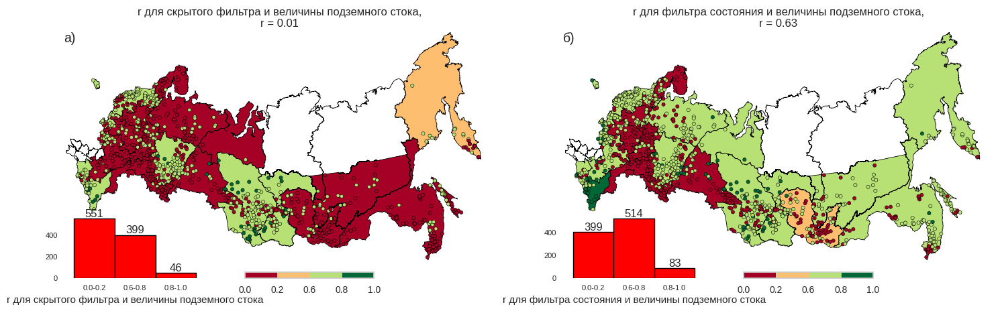

In [24]:
subsurface_h_n_r = subsurface_state["r скрытый фильтр"].median()
subsurface_c_n_r = subsurface_state["r фильтр состояния"].median()

for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = subsurface_state.loc[
        [geom.intersects(gage_point) for gage_point in subsurface_state["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["r скрытый фильтр", "r фильтр состояния"]] = ugms_part[
        ["r скрытый фильтр", "r фильтр состояния"]
    ].median()

basin_districts.loc[[26, 27], ["r скрытый фильтр", "r фильтр состояния"]] = np.nan

meteo_nse = russia_plots_n(
    gdf_to_plot=subsurface_state,
    basemap_data=basemap_data,
    figsize=(15, 6),
    nrows=1,
    ncols=2,
    label_list=["а)", "б)"],
    list_of_limits=[0.0, 0.2, 0.6, 0.8, 1.0],
    columns_from_gdf=["r скрытый фильтр", "r фильтр состояния"],
    hist_name=[
        "r для скрытого фильтра и величины подземного стока",
        "r для фильтра состояния и величины подземного стока",
    ],
    with_histogram=True,
    title_text=[
        f"r для скрытого фильтра и величины подземного стока,\nr = {subsurface_h_n_r:.2f}",
        f"r для фильтра состояния и величины подземного стока,\nr = {subsurface_c_n_r:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)


### Snow depth

In [ ]:
snow_depth_state = pd.DataFrame()
snow_depth_depth = dict()

for gauge_id in tqdm(gauges_file.index):
    try:
        gauge_cor, gauge_state_cor = lstm_layer_correlation(
            state_dict=example_states,
            date_range=test_date_range.to_numpy(),
            meteo_array=pd.read_csv(
                f"../data/snow_and_subsurface/era5_land/snow_depth/{gauge_id}.csv",
                index_col="date",
                parse_dates=["date"],
            )
            .loc[test_date_range]
            .to_numpy()
            .ravel(),
            correlation_threshold=0.6,
            data_name="Подземный сток",
        )
        snow_depth_state.loc[gauge_id, "r скрытый фильтр"] = gauge_cor["h_n"]
        snow_depth_state.loc[gauge_id, "r фильтр состояния"] = gauge_cor["c_n"]
        snow_depth_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
        gauge_state_cor = {
            cell: [int(i[0]) for i in vals] for cell, vals in gauge_state_cor.items()
        }
        snow_depth_depth[gauge_id] = gauge_state_cor
    except FileNotFoundError:
        snow_depth_state.loc[gauge_id, "r скрытый фильтр"] = 0.01
        snow_depth_state.loc[gauge_id, "r фильтр состояния"] = 0.01
        snow_depth_state.loc[gauge_id, "geometry"] = gauges_file.loc[gauge_id, "geometry"]
    # snow_depth_state.loc[gauge_id, "r "] = gauge_cor["h_n"]
snow_depth_state = gpd.GeoDataFrame(
    snow_depth_state, geometry="geometry", crs="epsg:4326"
)


  0%|          | 0/996 [00:00<?, ?it/s]

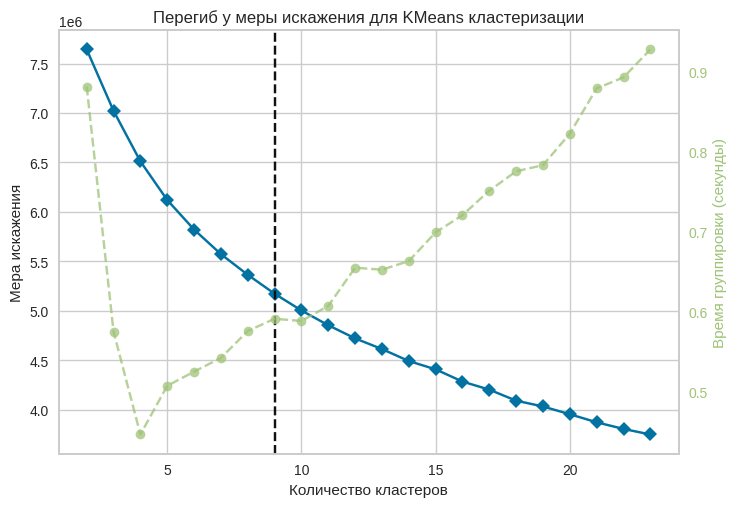

In [ ]:
# Import ElbowVisualizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

snow_depth_depth_c_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["c_n"] for gauge_id, cell_dict in snow_depth_depth.items()}
    )
    .T
)
snow_depth_depth_h_n = (
    pd.DataFrame()
    .from_dict(
        {gauge_id: cell_dict["h_n"] for gauge_id, cell_dict in snow_depth_depth.items()}
    )
    .T
)

raw_features = snow_depth_depth_c_n.values

model = KMeans(random_state=42, init="k-means++", n_init=420)
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2, 24), timings=True)
visualizer.fit(raw_features)  # Fit data to visualizer
visualizer.show();


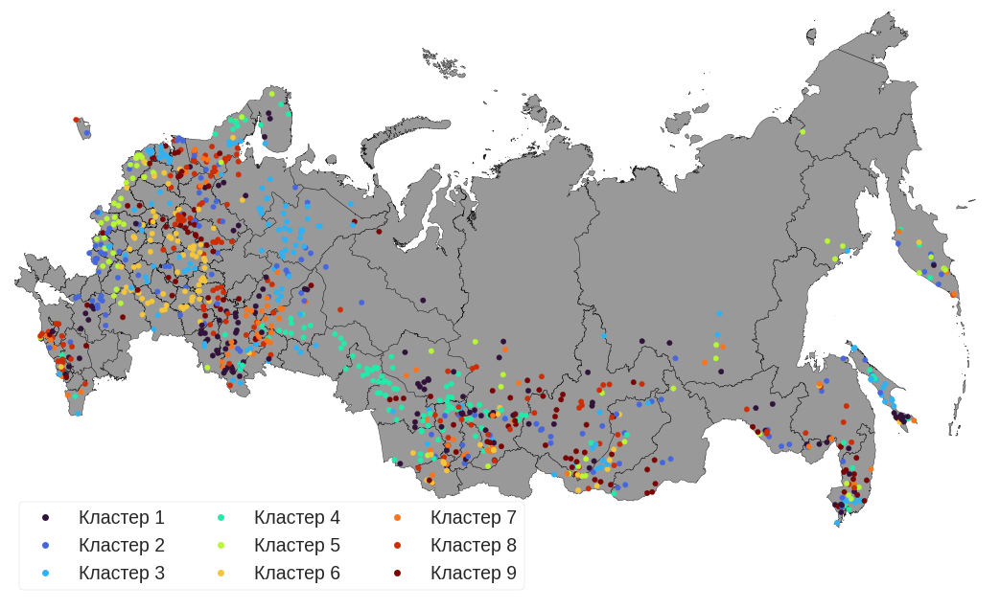

In [ ]:
number_of_clusters = 9

cluster_alg = KMeans(
    n_clusters=number_of_clusters, random_state=42, init="k-means++", n_init=420
)

yhat_AC = cluster_alg.fit_predict(raw_features)
subsurface_depth_c_n["ResClust"] = [i + 1 for i in yhat_AC]

gauges_file["ResClust"] = np.nan

gauges_file = gauges_file.combine_first(subsurface_depth_c_n).dropna()
gauges_file["Кластер"] = [f"Кластер {int(i)}" for i in gauges_file["ResClust"]]

gauges_fig = russia_plots(
    gdf_to_plot=gauges_file,
    basemap_data=basemap_data,
    distinction_col="Кластер",
    cmap_name="turbo",
    #   metric_col='Кластер',
    # list_of_limits=list(range(1, 5)),
    figsize=(15, 8),
    just_points=True,
)


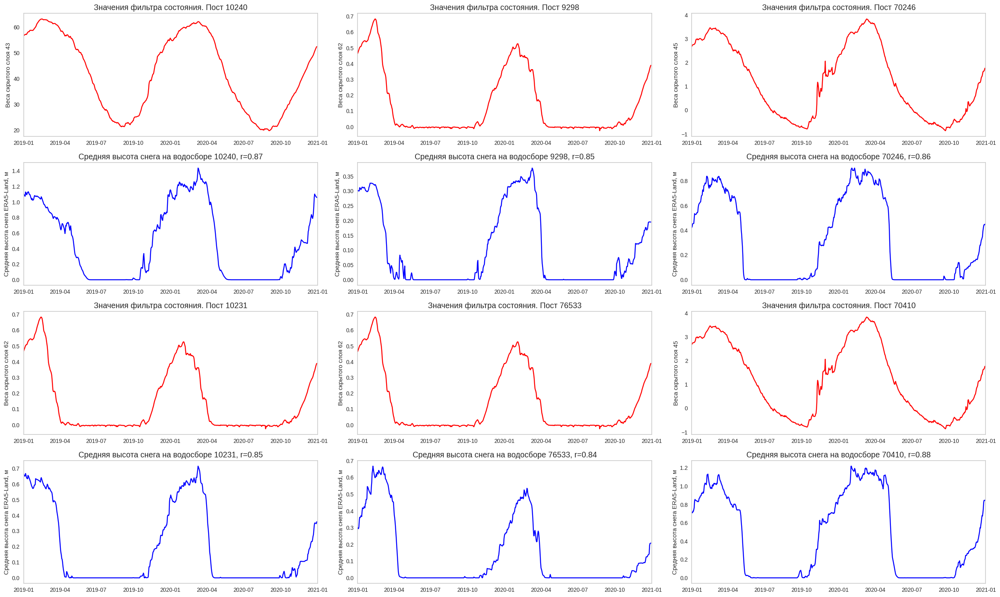

In [ ]:
sample_snow_depth = (
    snow_depth_state.sort_values(by="r скрытый фильтр", ascending=False)
    .head(420)
    .sample(n=6, random_state=42)
)


# Create a figure
fig = plt.figure(figsize=(25, 15))

# Define the GridSpec
gs = gridspec.GridSpec(4, 3)

# Add subplots
axs = [fig.add_subplot(gs[i, j]) for i in range(4) for j in range(3)]
cell_axs = [0, 1, 2, 6, 7, 8]
meteo_axs = [3, 4, 5, 9, 10, 11]

for gauge_id, cell_i, meteo_j in zip(
    sample_snow_depth.index, cell_axs, meteo_axs, strict=False
):
    plot_cell = torch.cat(
        [example_states["c_n"][:-1, -1, snow_depth_depth[f"{gauge_id}"]["c_n"][0]]], dim=0
    )
    plot_cell = plot_cell.detach().numpy()

    meteo_array = (
        pd.read_csv(
            f"../data/snow_and_subsurface/era5_land/snow_depth/{gauge_id}.csv",
            index_col="date",
            parse_dates=["date"],
        )
        .loc[test_date_range.to_numpy()]
        .to_numpy()
        .ravel()
    )

    ax_plot(
        gauge_id=f"{gauge_id}",
        cell_ax=axs[cell_i],
        cell_ax_title=f"Значения фильтра состояния. Пост {gauge_id}",
        cell_ax_ylabel=f"Веса скрытого слоя {snow_depth_depth[gauge_id]['c_n'][0]}",
        meteo_ax=axs[meteo_j],
        meteo_ax_title=f"Средняя высота снега на водосборе {gauge_id}, r={snow_depth_state.loc[f'{gauge_id}', 'r скрытый фильтр']:.2f}",
        meteo_ax_ylabel="Средняя высота снега ERA5-Land, м",
        cell_data=plot_cell,
        meteo_data=meteo_array,
        data_range=test_date_range.to_numpy(),
    )

    plt.tight_layout()


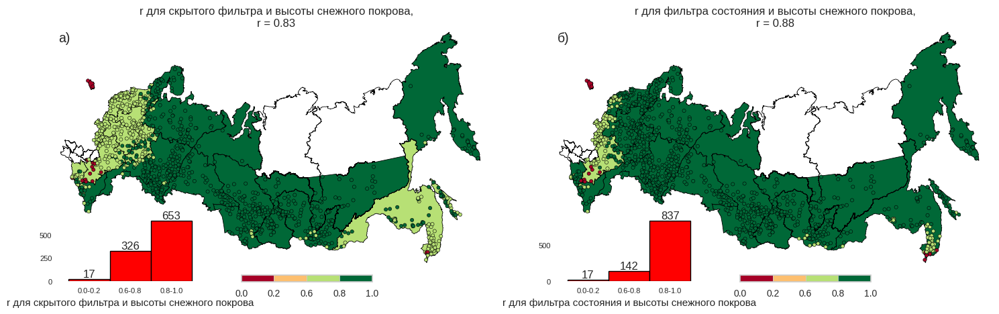

In [29]:
snow_depth_h_n_r = snow_depth_state["r скрытый фильтр"].median()
snow_depth_c_n_r = snow_depth_state["r фильтр состояния"].median()

for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = snow_depth_state.loc[
        [geom.intersects(gage_point) for gage_point in snow_depth_state["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["r скрытый фильтр", "r фильтр состояния"]] = ugms_part[
        ["r скрытый фильтр", "r фильтр состояния"]
    ].median()

basin_districts.loc[[26, 27], ["r скрытый фильтр", "r фильтр состояния"]] = np.nan

meteo_nse = russia_plots_n(
    gdf_to_plot=snow_depth_state,
    basemap_data=basemap_data,
    figsize=(15, 6),
    nrows=1,
    ncols=2,
    label_list=["а)", "б)"],
    list_of_limits=[0.0, 0.2, 0.6, 0.8, 1.0],
    columns_from_gdf=["r скрытый фильтр", "r фильтр состояния"],
    hist_name=[
        "r для скрытого фильтра и высоты снежного покрова",
        "r для фильтра состояния и высоты снежного покрова",
    ],
    with_histogram=True,
    title_text=[
        f"r для скрытого фильтра и высоты снежного покрова,\nr = {snow_depth_h_n_r:.2f}",
        f"r для фильтра состояния и высоты снежного покрова,\nr = {snow_depth_c_n_r:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)


## Blind forecast results

In [38]:
basin_districts = gpd.read_file("../data/geometry/basin_districts_2025.gpkg")
basin_districts = basin_districts.reset_index(drop=True)
basin_districts.drop([29, 26], inplace=True)
basin_districts = basin_districts.reindex(
    [
        0,
        1,
        2,
        3,
        4,
        5,
        6,
        7,
        8,
        28,
        10,
        11,
        12,
        30,
        14,
        15,
        16,
        17,
        18,
        19,
        20,
        27,
        22,
        23,
        24,
        25,
        9,
        13,
        21,
    ]
)
basin_districts = basin_districts.rename(columns={"BAS_OKRUG": "name1"})
basin_districts = basin_districts.reset_index(drop=True)

In [ ]:
gauges_partial = gpd.read_file("../data/geometry/partial_gauges.gpkg")
gauges_partial["gauge_id"] = gauges_partial["gauge_id"].astype(str)
gauges_partial = gauges_partial.set_index("gauge_id")

era5_blind, lstm_era5_nse = read_table_gauge_str(
    "../conclusions/tables/era5_blind.csv", index_filter=gauges_partial.index
)
era5l_blind, lstm_era5_land_nse = read_table_gauge_str(
    "../conclusions/tables/era5l_blind.csv", index_filter=gauges_partial.index
)
gpcp_blind, lstm_gpcp_nse = read_table_gauge_str(
    "../conclusions/tables/gpcp_blind.csv", index_filter=gauges_partial.index
)
mswep_blind, lstm_mswep_nse = read_table_gauge_str(
    "../conclusions/tables/mswep_blind.csv", index_filter=gauges_partial.index
)

lstm_geom_nse = pd.concat(
    [
        mswep_blind.loc[:, "NSE"],
        era5_blind.loc[:, "NSE"],
        era5l_blind.loc[:, "NSE"],
        gpcp_blind.loc[:, "NSE"],
    ],
    axis=1,
)
lstm_geom_nse.columns = [
    "NSE LSTM MSWEP",
    "NSE LSTM ERA5",
    "NSE LSTM ERA5-Land",
    "NSE LSTM GPCP",
]
lstm_geom_nse["geometry"] = gauges_partial.loc[:, ["geometry"]]
lstm_geom_nse = gpd.GeoDataFrame(
    lstm_geom_nse, geometry=lstm_geom_nse["geometry"], crs=4326
)
lstm_geom_nse["Best Meteo NSE"] = lstm_geom_nse[
    ["NSE LSTM MSWEP", "NSE LSTM ERA5", "NSE LSTM ERA5-Land", "NSE LSTM GPCP"]
].max(axis=1)
mswep_index = lstm_geom_nse[
    lstm_geom_nse["Best Meteo NSE"].isin(lstm_geom_nse["NSE LSTM MSWEP"])
].index
era5_index = lstm_geom_nse[
    lstm_geom_nse["Best Meteo NSE"].isin(lstm_geom_nse["NSE LSTM ERA5"])
].index
era5_land_index = lstm_geom_nse[
    lstm_geom_nse["Best Meteo NSE"].isin(lstm_geom_nse["NSE LSTM ERA5-Land"])
].index
gpcp_index = lstm_geom_nse[
    lstm_geom_nse["Best Meteo NSE"].isin(lstm_geom_nse["NSE LSTM GPCP"])
].index

for name, index in {
    "MSWEP": mswep_index,
    "ERA5": era5_index,
    "ERA5-Land": era5_land_index,
    "GPCP": gpcp_index,
}.items():
    lstm_geom_nse.loc[index, "Лучшая метео модель"] = name
ugms_dict = dict()

for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = lstm_geom_nse.loc[
        [geom.intersects(gage_point) for gage_point in lstm_geom_nse["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]
    ugms_dict[ugms_name] = ugms_part
    basin_districts.loc[i, ["Best Meteo NSE"]] = ugms_part[["Best Meteo NSE"]].median()

basin_districts.loc[[26, 27, 28], ["Best Meteo NSE"]] = np.nan

In [ ]:
# Ensure the column with the best reanalysis NSE exists (rename or create)
reanalysis_cols = [
    "NSE LSTM MSWEP",
    "NSE LSTM ERA5",
    "NSE LSTM ERA5-Land",
    "NSE LSTM GPCP",
]

# If the Russian column does not exist, try to rename the English one or compute it
if "NSE LSTM лучший реанализ" not in lstm_geom_nse.columns:
    if "Best Meteo NSE" in lstm_geom_nse.columns:
        lstm_geom_nse = lstm_geom_nse.rename(
            columns={"Best Meteo NSE": "NSE LSTM лучший реанализ"}
        )
    else:
        lstm_geom_nse["NSE LSTM лучший реанализ"] = lstm_geom_nse[reanalysis_cols].max(
            axis=1
        )

# Clip negative NSE values to 0 for all relevant columns
cols_to_clip = ["NSE LSTM лучший реанализ"] + reanalysis_cols
lstm_geom_nse[cols_to_clip] = lstm_geom_nse[cols_to_clip].clip(lower=0.0)

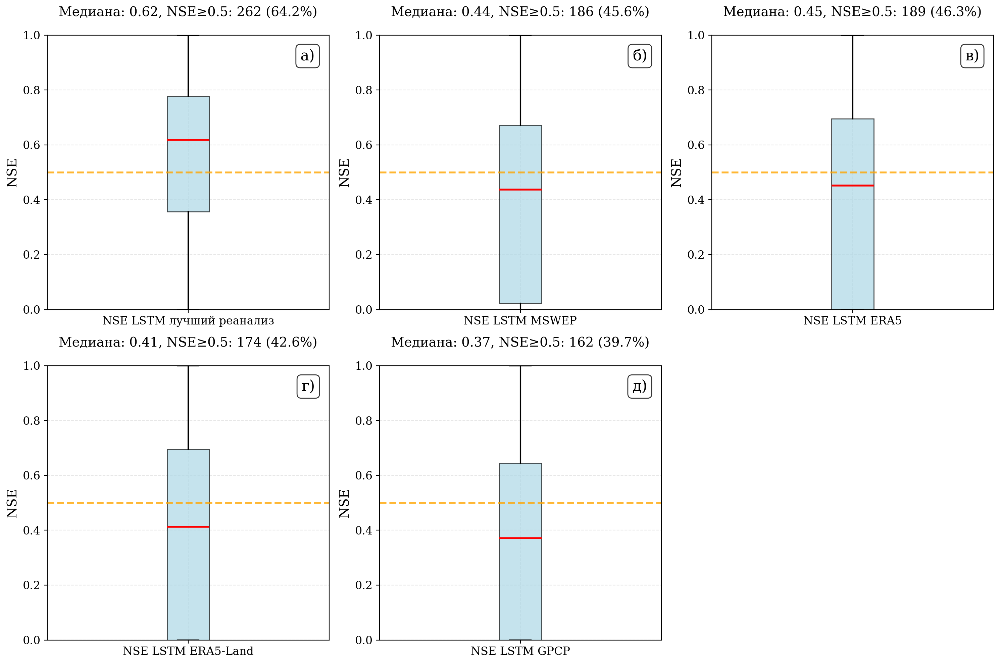

In [34]:
fig = create_nse_boxplots(
    df=lstm_geom_nse,
    nse_columns=[
        "NSE LSTM лучший реанализ",
        "NSE LSTM MSWEP",
        "NSE LSTM ERA5",
        "NSE LSTM ERA5-Land",
        "NSE LSTM GPCP",
    ],
    figsize=(15, 10),
    max_cols=3,
    color="lightblue",
    save_path="../conclusions/images/LSTM_blind_meteo_5_boxplots.png",  # Specify the path to save the figure,
)

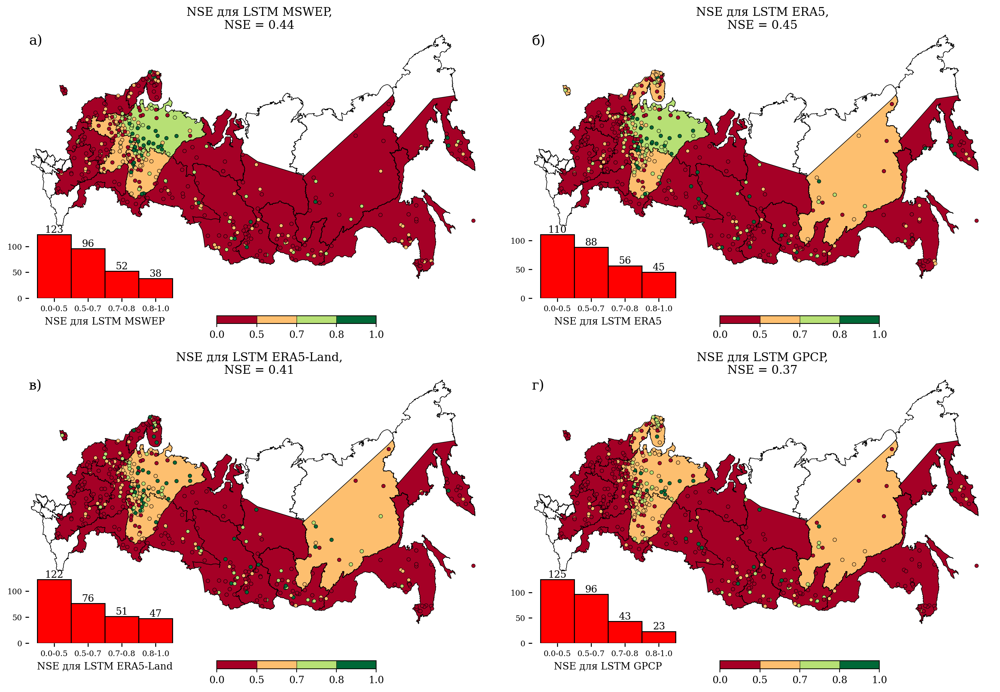

In [ ]:
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = lstm_geom_nse.loc[
        [geom.intersects(gage_point) for gage_point in lstm_geom_nse["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[
        i, ["NSE LSTM MSWEP", "NSE LSTM ERA5", "NSE LSTM ERA5-Land", "NSE LSTM GPCP"]
    ] = ugms_part[
        ["NSE LSTM MSWEP", "NSE LSTM ERA5", "NSE LSTM ERA5-Land", "NSE LSTM GPCP"]
    ].median()

basin_districts.loc[
    [26, 27, 28],
    ["NSE LSTM MSWEP", "NSE LSTM ERA5", "NSE LSTM ERA5-Land", "NSE LSTM GPCP"],
] = np.nan

meteo_nse = russia_plots_n(
    gdf_to_plot=lstm_geom_nse,
    basemap_data=basemap_data,
    figsize=(15, 10),
    nrows=2,
    ncols=2,
    label_list=["а)", "б)", "в)", "г)"],
    columns_from_gdf=[
        "NSE LSTM MSWEP",
        "NSE LSTM ERA5",
        "NSE LSTM ERA5-Land",
        "NSE LSTM GPCP",
    ],
    hist_name=[
        "NSE для LSTM MSWEP",
        "NSE для LSTM ERA5",
        "NSE для LSTM ERA5-Land",
        "NSE для LSTM GPCP",
    ],
    with_histogram=True,
    title_text=[
        f"NSE для LSTM MSWEP,\nNSE = {lstm_mswep_nse:.2f}",
        f"NSE для LSTM ERA5,\nNSE = {lstm_era5_nse:.2f}",
        f"NSE для LSTM ERA5-Land,\nNSE = {lstm_era5_land_nse:.2f}",
        f"NSE для LSTM GPCP,\nNSE = {lstm_gpcp_nse:.2f}",
    ],
    ugms=True,
    ugms_gdf=basin_districts.sort_index(),
)


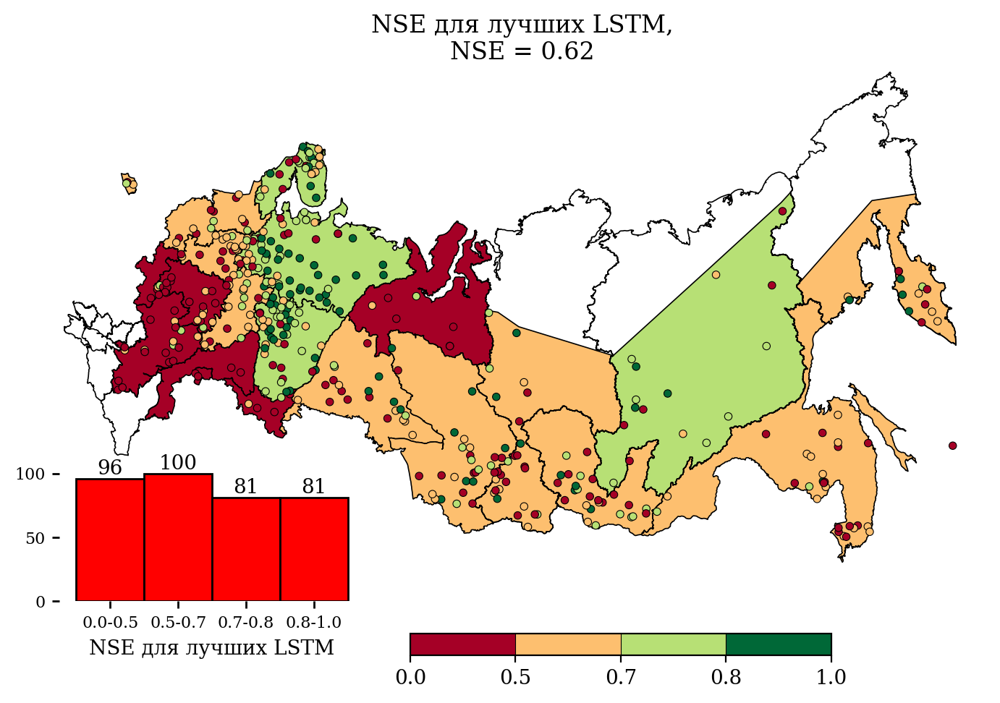

In [ ]:
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = lstm_geom_nse.loc[
        [geom.intersects(gage_point) for gage_point in lstm_geom_nse["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["Best Meteo NSE"]] = ugms_part[["Best Meteo NSE"]].median()
    lstm_geom_nse.loc[
        [geom.intersects(gage_point) for gage_point in lstm_geom_nse["geometry"]],
        "Бассейновый округ",
    ] = ugms_name

basin_districts.loc[[26, 27, 28], ["Best Meteo NSE"]] = np.nan

meteo_nse = russia_plots_n(
    gdf_to_plot=lstm_geom_nse,
    basemap_data=basemap_data,
    figsize=(10, 5),
    nrows=1,
    ncols=1,
    label_list=[""],
    columns_from_gdf=["Best Meteo NSE"],
    hist_name=["NSE для лучших LSTM"],
    with_histogram=True,
    title_text=[
        f"NSE для лучших LSTM,\nNSE = {lstm_geom_nse['Best Meteo NSE'].median():.2f}"
    ],
    ugms=True,
    ugms_gdf=basin_districts.sort_index(),
)


In [ ]:
lstm_meteo_blind_selected = pd.concat(
    [
        mswep_blind.loc[mswep_index, :].median().to_frame().T,
        era5_blind.loc[era5_index, :].median().to_frame().T,
        era5l_blind.loc[era5_land_index, :].median().to_frame().T,
        gpcp_blind.loc[gpcp_index, :].median().to_frame().T,
    ]
)

lstm_meteo_blind_selected.index = pd.Index(
    ["NSE LSTM MSWEP", "NSE LSTM ERA5", "NSE LSTM ERA5-Land", "NSE LSTM GPCP"]
)
lstm_meteo_blind_selected.index.name = "Модель"
lstm_meteo_blind_selected.to_csv("../data/dw_tables/lstm_meteo_4_selected_blind.csv")


In [ ]:
lstm_meteo_4_blind = pd.concat(
    [
        mswep_blind.loc[gauges_partial.index, :].median().to_frame().T,
        era5l_blind.loc[gauges_partial.index, :].median().to_frame().T,
        era5l_blind.loc[gauges_partial.index, :].median().to_frame().T,
        gpcp_blind.loc[gauges_partial.index, :].median().to_frame().T,
        lstm_meteo_blind_selected.median().to_frame().T,
    ]
)
lstm_meteo_4_blind.index = pd.Index(
    [
        "NSE LSTM MSWEP",
        "NSE LSTM ERA5",
        "NSE LSTM ERA5-Land",
        "NSE LSTM GPCP",
        "Best Meteo NSE",
    ]
)
lstm_meteo_4_blind.index.name = "Модель"
# lstm_meteo_4_blind.to_csv("../data/dw_tables/lstm_meteo_4_blind.csv")
lstm_meteo_4_blind.to_csv("../data/dw_tables/lstm_meteo_4_comp_blind.csv")


In [ ]:
basin_districts.loc[
    :,
    [
        "name1",
        "NSE LSTM MSWEP",
        "NSE LSTM ERA5",
        "NSE LSTM ERA5-Land",
        "NSE LSTM GPCP",
        "Best Meteo NSE",
    ],
].dropna().to_csv("../data/dw_tables/bo_blind_regional.csv", index=False)


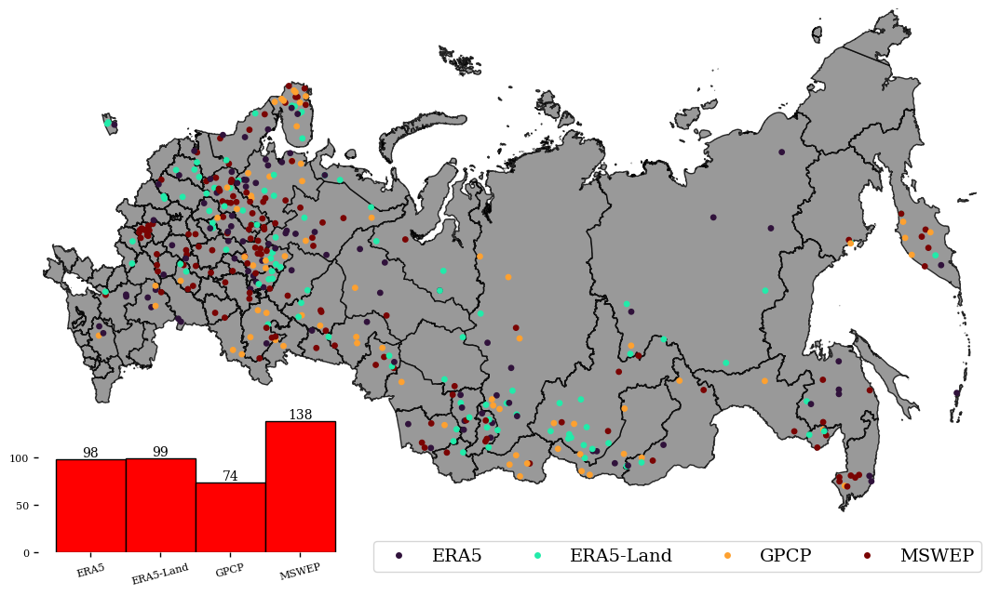

In [178]:
gauges_fig = russia_plots(
    gdf_to_plot=lstm_geom_nse,
    basemap_data=basemap_data,
    distinction_col="Лучшая метео модель",
    cmap_name="turbo",
    list_of_limits=list(range(1, 5)),
    figsize=(15, 8),
    just_points=True,
    legend_cols=4,
    with_histogram=True,
)


In [ ]:
lstm_geom_nse[["Лучшая метео модель", "Бассейновый округ"]].to_csv(
    "../data/dw_tables/best_blind_model_general.csv"
)


In [ ]:
basin_districts[["name1", "Лучшая метео модель"]].dropna().to_csv(
    "../data/dw_tables/best_blind_model_33.csv", index=False
)


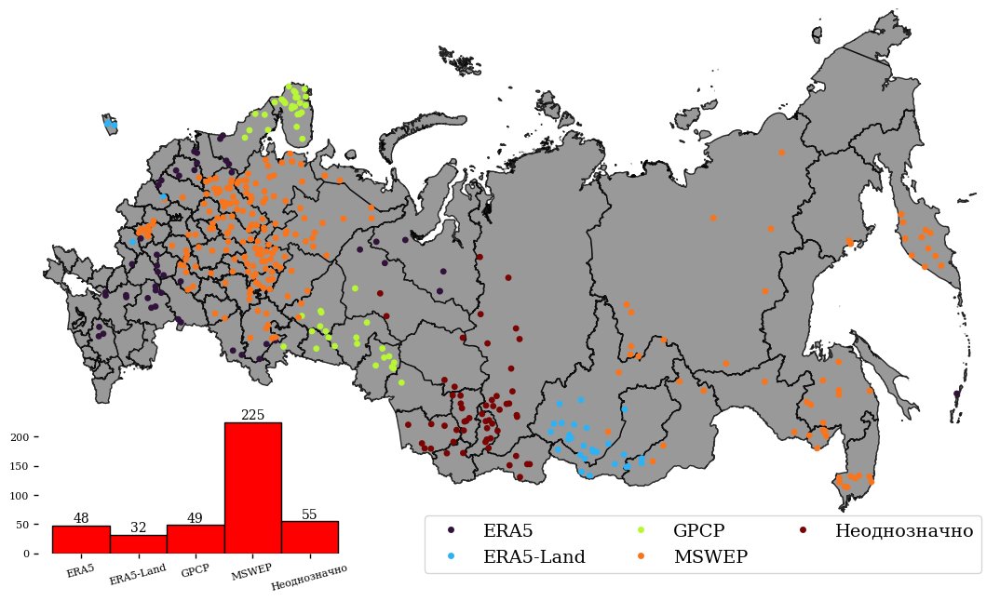

In [ ]:
from copy import deepcopy

lstm_geom_nse_type = deepcopy(lstm_geom_nse)

model_dict = {
    "MSWEP": 1,
    "ERA5-Land": 2,
    "ERA5": 3,
    "GPCP": 4,
    "Неоднозначно": 5,
    np.nan: np.nan,
}
cool_model = np.nan
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = lstm_geom_nse_type.loc[
        [geom.intersects(gage_point) for gage_point in lstm_geom_nse_type["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]
    try:
        example = ugms_part["Лучшая метео модель"].value_counts()

        for model, value in example.items():
            if value / example.sum() > 0.33:
                cool_model = model
                break
            else:
                cool_model = "Неоднозначно"

        basin_districts.loc[i, ["Лучшая метео модель"]] = model_dict[cool_model]
        lstm_geom_nse_type.loc[
            [
                geom.intersects(gage_point)
                for gage_point in lstm_geom_nse_type["geometry"]
            ],
            ["Лучшая метео модель"],
        ] = cool_model
    except IndexError:
        basin_districts.loc[i, ["Лучшая метео модель"]] = np.nan
basin_districts.loc[[26, 27], ["Лучшая метео модель"]] = np.nan
# lstm_geom_nse_type["Лучшая метео модель"] = [model_dict[i] for i in lstm_geom_nse_type["Лучшая метео модель"]]

gauges_fig = russia_plots(
    gdf_to_plot=lstm_geom_nse_type,
    basemap_data=basemap_data,
    distinction_col="Лучшая метео модель",
    cmap_name="turbo",
    list_of_limits=list(range(1, 5)),
    figsize=(15, 8),
    just_points=True,
    legend_cols=3,
    with_histogram=True,
)
basin_districts["Лучшая метео модель"] = [
    {k: v for v, k in model_dict.items()}[i] if not np.isnan(i) else np.nan
    for i in basin_districts["Лучшая метео модель"]
]


In [ ]:
basin_districts[["name1", "Лучшая метео модель"]].dropna().to_csv(
    "../data/dw_tables/best_blind_model_33.csv", index=False
)


In [ ]:
lstm_geom_nse.to_csv("../data/dw_tables/lstm_nse_by_bo.csv")


### q5, q95, mean, baseflow 

### Blind

In [41]:
from scripts.hydro_metrics import hydro_job
from scripts.processing import split_by_hydro_year, split_by_year
from tqdm.notebook import tqdm

In [ ]:
mswep_pickle = Path(
    "../data/lstm_configs/model_runs/cudalstm_q_mm_day_mswep_no_autocorr_static_1103_191754/test/model_epoch024/test_results.p"
)
gpcp_pickle = Path(
    "../data/lstm_configs/model_runs/cudalstm_q_mm_day_gpcp_no_autocorr_static_1203_080402/test/model_epoch024/test_results.p"
)
era5l_pickle = Path(
    "../data/lstm_configs/model_runs/cudalstm_q_mm_day_era5l_no_autocorr_static_1003_133332/test/model_epoch026/test_results.p"
)
era5_pickle = Path(
    "../data/lstm_configs/model_runs/cudalstm_q_mm_day_era5_no_autocorr_static_1203_220232/test/model_epoch020/test_results.p"
)
gage_comp = dict()
final_list = list()

for gauge_id in tqdm(gauges_partial.index):
    if gauge_id in mswep_index:
        pickle_file = mswep_pickle
    elif gauge_id in gpcp_index:
        pickle_file = gpcp_pickle
    elif gauge_id in era5_index:
        pickle_file = era5_pickle
    else:
        pickle_file = era5l_pickle
    try:
        df_res = pd.read_pickle(pickle_file)[f"{gauge_id}"]["1D"]["xr"]
        draw_df = pd.DataFrame()
        obs, pred = (
            df_res["q_mm_day_obs"].to_numpy().squeeze()[:-1],
            df_res["q_mm_day_sim"].to_numpy().squeeze()[:-1],
        )

        draw_df.index = df_res.date[:-1]
        draw_df["Наблюдения, мм/день"] = obs
        draw_df["Модель, мм/день"] = pred

        gage_comp[gauge_id] = dict()
        for col in draw_df.columns:
            year_res = list()
            hydro_years = split_by_hydro_year(draw_df[col])
            calendar_years = split_by_year(draw_df[col])

            for year in hydro_years.keys():
                year_res.append(
                    pd.DataFrame(
                        hydro_job(
                            hydro_year=hydro_years[year],
                            calendar_year=calendar_years[year],
                        ),
                        index=[0],
                    )
                )
            year_res = pd.concat(year_res)
            gage_comp[gauge_id][col] = year_res
        res_df = (
            (
                gage_comp[gauge_id]["Наблюдения, мм/день"]
                - gage_comp[gauge_id]["Модель, мм/день"]
            )
            / gage_comp[gauge_id]["Наблюдения, мм/день"]
            * 100
        )
        res_df = res_df.mean().to_frame().T
        res_df["gauge_id"] = gauge_id
        final_list.append(res_df)
    except KeyError:
        continue
final_list = pd.concat(final_list).set_index("gauge_id", drop=True)

  0%|          | 0/409 [00:00<?, ?it/s]

KeyError: 'mean'

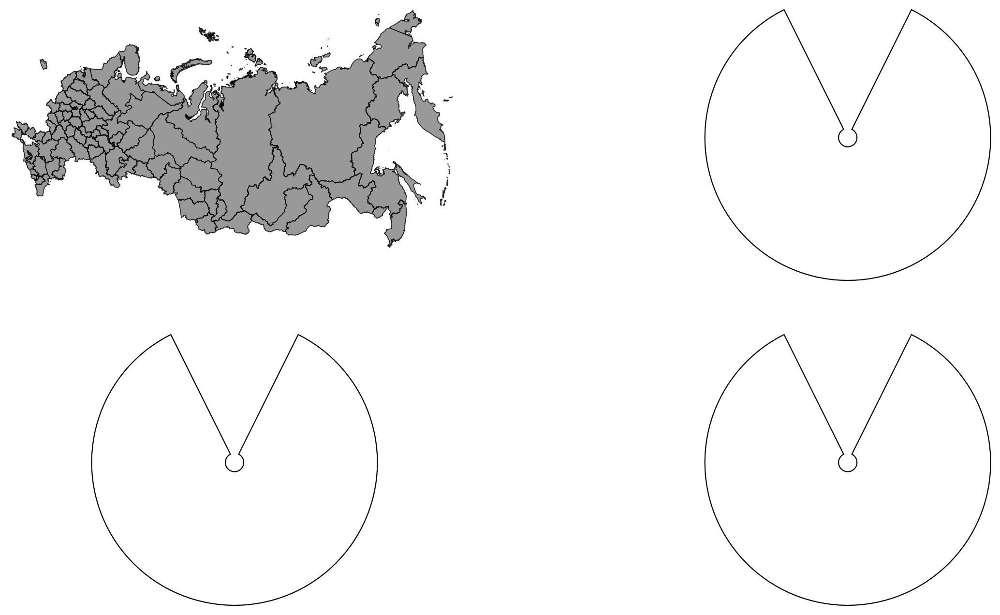

In [43]:
metrics = russia_plots_n(
    gdf_to_plot=lstm_geom_nse,
    basemap_data=basemap_data,
    cmap_name="seismic",
    figsize=(15, 8),
    list_of_limits=[-100, -50, -25, 0, 25, 50, 100],
    cmap_lims=(-100, 100),
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    columns_from_gdf=["mean", "bfi", "q5", "q95"],
    with_histogram=True,
    hist_name=[
        "Распределение величин",
        "Распределение величин",
        "Распределение величин",
        "Распределение величин",
    ],
    title_text=[
        "Ошибка определения среднего расхода, %",
        "Ошибка определения индекса базового стока, %",
        "Ошибка определения расхода 5-й квантили, %",
        "Ошибка определения расхода 95-й квантили, %",
    ],
)


### Common

In [ ]:
mswep_pickle = Path(
    "../data/lstm_configs/model_runs/cudalstm_q_mm_day_mswep_no_autocorr_static_1103_191754/test/model_epoch024/test_results.p"
)
gpcp_pickle = Path(
    "../data/lstm_configs/model_runs/cudalstm_q_mm_day_gpcp_no_autocorr_static_1203_080402/test/model_epoch024/test_results.p"
)
era5l_pickle = Path(
    "../data/lstm_configs/model_runs/cudalstm_q_mm_day_era5l_no_autocorr_static_1003_133332/test/model_epoch026/test_results.p"
)
era5_pickle = Path(
    "../data/lstm_configs/model_runs/cudalstm_q_mm_day_era5_no_autocorr_static_1203_220232/test/model_epoch020/test_results.p"
)
gage_comp = dict()
final_list = list()

for gauge_id in tqdm(ws_file.index):
    try:
        if gauge_id in mswep_index:
            pickle_file = mswep_pickle
        elif gauge_id in gpcp_index:
            pickle_file = gpcp_pickle
        elif gauge_id in era5_index:
            pickle_file = era5_pickle
        else:
            pickle_file = era5l_pickle
        df_res = pd.read_pickle(pickle_file)[f"{gauge_id}"]["1D"]["xr"]
        draw_df = pd.DataFrame()
        obs, pred = (
            df_res["q_mm_day_obs"].to_numpy().squeeze()[:-1],
            df_res["q_mm_day_sim"].to_numpy().squeeze()[:-1],
        )

        draw_df.index = df_res.date[:-1]
        draw_df["Наблюдения, мм/день"] = obs
        draw_df["Модель, мм/день"] = pred

        gage_comp[gauge_id] = dict()
        for col in draw_df.columns:
            year_res = list()
            hydro_years = split_by_hydro_year(draw_df[col])
            calendar_years = split_by_year(draw_df[col])

            for year in hydro_years.keys():
                year_res.append(
                    pd.DataFrame(
                        hydro_job(
                            hydro_year=hydro_years[year],
                            calendar_year=calendar_years[year],
                        ),
                        index=[0],
                    )
                )
            year_res = pd.concat(year_res)
            gage_comp[gauge_id][col] = year_res
        res_df = (
            (
                gage_comp[gauge_id]["Наблюдения, мм/день"]
                - gage_comp[gauge_id]["Модель, мм/день"]
            )
            / gage_comp[gauge_id]["Наблюдения, мм/день"]
            * 100
        )
        res_df = res_df.mean().to_frame().T
        res_df["gauge_id"] = gauge_id
        final_list.append(res_df)
    except KeyError:
        continue
final_list = pd.concat(final_list).set_index("gauge_id", drop=True)


  0%|          | 0/996 [00:00<?, ?it/s]

In [205]:
final_list["geometry"] = gauges_file.loc[:, ["geometry"]]
final_list = gpd.GeoDataFrame(final_list, geometry=final_list["geometry"], crs=4326)
final_list

,mean,bfi,q5,q95,geometry
gauge_id,,,,,
70158,-12.980536,-3.928788,3.832665,-20.656134,POINT (45.634 60.054)
8290,-51.468609,-28.424026,7.580474,-375.922338,POINT (97.383 58.032)
70583,27.152811,-29.509377,45.170069,-86.240262,POINT (39.273 59.991)
76408,55.951096,-18.935849,62.452985,25.628085,POINT (59.675 55.172)
72668,-22.334541,0.595954,-24.224751,-10.570312,POINT (29.146 56.505)
...,...,...,...,...,...
10584,18.213980,-23.866933,26.206287,-204.637730,POINT (88.325 55.764)
72577,-4.772883,-6.157132,3.192646,-19.772190,POINT (28.593 59.383)
8347,-23.126160,-12.211505,-16.296108,-40.640126,POINT (98.665 55.537)


In [ ]:
for i, geom in enumerate(basin_districts["geometry"]):
    ugms_part = final_list.loc[
        [geom.intersects(gage_point) for gage_point in final_list["geometry"]], :
    ]
    ugms_name = basin_districts.loc[i, "name1"]

    basin_districts.loc[i, ["mean", "bfi", "q5", "q95"]] = ugms_part[
        ["mean", "bfi", "q5", "q95"]
    ].median()
    final_list.loc[
        [geom.intersects(gage_point) for gage_point in final_list["geometry"]],
        "Бассейновый округ",
    ] = ugms_name
basin_districts.loc[[26, 27], ["mean", "bfi", "q5", "q95"]] = np.nan


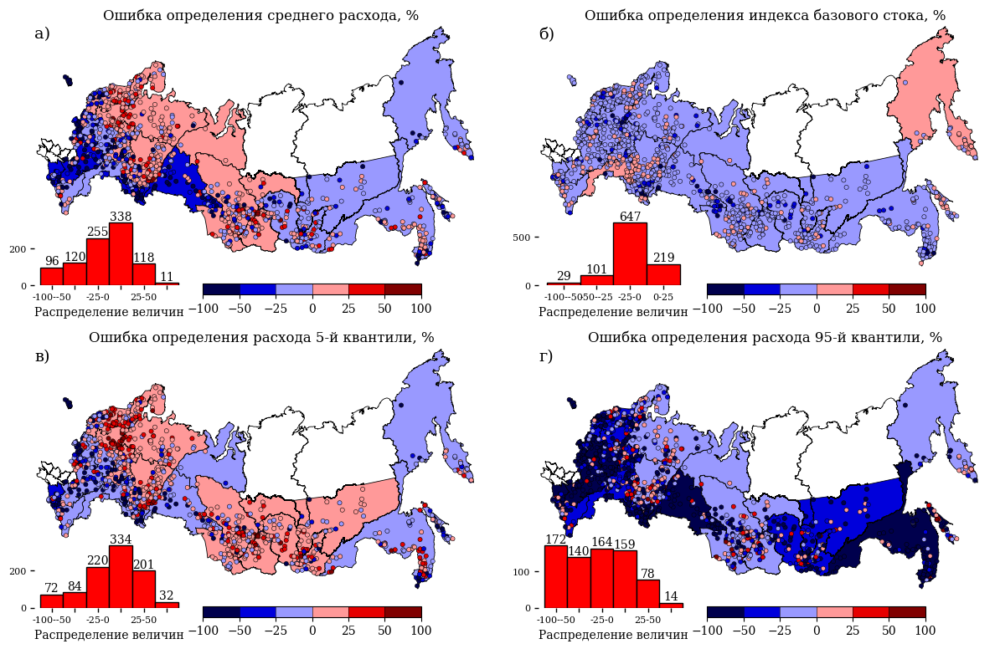

In [ ]:
metrics = russia_plots_n(
    gdf_to_plot=final_list,
    basemap_data=basemap_data,
    cmap_name="seismic",
    figsize=(15, 8),
    list_of_limits=[-100, -50, -25, 0, 25, 50, 100],
    cmap_lims=(-100, 100),
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    columns_from_gdf=["mean", "bfi", "q5", "q95"],
    with_histogram=True,
    hist_name=[
        "Распределение величин",
        "Распределение величин",
        "Распределение величин",
        "Распределение величин",
    ],
    title_text=[
        "Ошибка определения среднего расхода, %",
        "Ошибка определения индекса базового стока, %",
        "Ошибка определения расхода 5-й квантили, %",
        "Ошибка определения расхода 95-й квантили, %",
    ],
    ugms=True,
    ugms_gdf=basin_districts,
)


In [ ]:
final_list.loc[:, ["mean", "bfi", "q5", "q95", "Бассейновый округ"]].to_csv(
    "../data/dw_tables/common_errors_bo.csv"
)